# Workflow
Jupyter notebook created to visualize the ML process of extracting and manipulating LUCAS data, plus model fitting and evaluation. All with the TerrasenseTK python toolkit

In [2]:
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import ComplementNB

import matplotlib.pyplot as plt
import terrasensetk as tstk
import seaborn as sns
import pandas as pd
import numpy as np
import pickle
import os

## Data science

### Dataset

#### Main dataframe

tstk.Dataset

In [3]:
eopatches_path = './EOPatches/sentinel-2'
# Gets dataset
dataset = tstk.Dataset(eopatches_path)
print(f'Extracted: {len(dataset.get_tspatches())} TSPatches')

Extracted: 16138 TSPatches


In [4]:
dataset.show()

Bands are never nan, as tstk only saves bands with values.

In [5]:
bands = dataset.get_bands()
bands

{'B:UB': 0,
 'B:BLUE': 1,
 'B:GREEN': 2,
 'B:RED': 3,
 'B:VNIR5': 4,
 'B:VNIR6': 5,
 'B:VNIR7': 6,
 'B:VNIR8': 7,
 'B:VNIR8a': 8,
 'B:SWIR9': 9,
 'B:SWIR11': 10,
 'B:SWIR12': 11}

Bands higly correlated to N, P, K nutrient estimation according to papers

In [5]:
# https://jast.modares.ac.ir/article-23-5138-en.html
# RED, VNIR6, VNIR7
N_bands = ['B:RED', 'B:VNIR6', 'B:VNIR7']
# https://jast.modares.ac.ir/article-23-5138-en.html
# BLUE, RED
# https://www.sciencedirect.com/science/article/pii/S1537511006002704?casa_token=OBfL1jiQmAIAAAAA:ZbNlZXeIPmoZFlU7uTOjtX1vOHJ9_6K1IC80YCsbG1WAEyDRsKTfWrgaqfKbQZm2GZm7VykS
# 305nm - 1710nm
P_bands = list(dataset.get_bands().keys())[:-1]
# https://jast.modares.ac.ir/article-23-5138-en.html
# RED
K_bands = ['B:RED']

Added a lot of indices that seem relevant.

In [6]:
# Adding new indices according to 
# https://custom-scripts.sentinel-hub.com/custom-scripts/sentinel-2/indexdb/
dataset.add_indices({
    # Soil productivity https://www.tandfonline.com/doi/abs/10.1080/10106049209354353
    # NDVI (MIR - NIR) / (MIR + NIR)
    # CD = [-1, 1]
    'NDVI': lambda b: (b[11] - b[7]) / (b[11] + b[7]),
    # EVI 2.5 * (NIR - RED) / ((NIR + 6*RED - 7.5*BLUE) + 1)
    # CD = IR
    'EVI': lambda b: 2.5 * (b[7] - b[3]) / ((b[7] + 6.0 * b[3] - 7.5 * b[1]) + 1.0),
    # NDMI (820nm - 1600nm) / (820nm + 1600nm)
    # CD = [-1, 1]
    'NDMI': lambda b: (b[7] - b[10]) / (b[7] + b[10]),
    # PVI (1 / sqrt(a^2+ 1)) * (NIR - ar - b)
    # CD = [-1.788, 0]
    'PVI': lambda b: (1.0 / (0.5**2.0 + 1.0)**0.5) * (b[7] - 0.5 - 0.5),
    # SAVI (800nm - 670nm) / (800nm + 670nm + L) * (1 + L)
    # CD = IR
    'SAVI': lambda b: (b[7] - b[3]) / (b[7] + b[3] + 0.5) * (1.0 + 0.5),
    # TSAVI (B * (NIR - B * R - A)) / (RED + B * (NIR - A) + X * (1 + B^2))
    # CD = IR
    'TSAVI': lambda b: (0.5 * (b[7] - 0.5 * b[3] - 0.5)) / (b[3] + 0.5 * (b[7] - 0.5) + 0.5 * (1.0 + 0.5**2.0)),
    # SAVI2 NIR/(RED+b/a) -> Requires soil information that we do not have
    # CL (RED - BLUE) / RED
    # CD = [-2, 2]
    'CL': lambda b: (b[3] - b[1]) / b[3],
    # Chlorophyll Green ([760:800]/[540:560])^(-1)
    # CD = IR \ 0
    'Chlgreen': lambda b: (b[bands['B:VNIR7']] / b[bands['B:GREEN']]) ** -1,
    # Chlorophyll Index Green:
    # CD = IR \ 0
    'CIG': lambda b: b[bands['B:VNIR8a']] / b[bands['B:GREEN']] - 1,
    # Ferric iron  
    # CD = IR
    'FE2': lambda b: (b[bands['B:SWIR12']] / b[bands['B:VNIR8']]) + (b[bands['B:GREEN']] / b[bands['B:RED']]),

    # N:
    # https://www.researchgate.net/profile/Alireza-Sharifi-3/publication/369786888_Remotely_sensed_normalized_difference_red-edge_index_for_rangeland_biomass_estimation/links/64a586cdb9ed6874a5fc6285/Remotely-sensed-normalized-difference-red-edge-index-for-rangeland-biomass-estimation.pdf
    # TCARI 3 * ((700nm - 670nm) - 0.2 * (700nm - 550nm) * (700nm / 670nm))
    # CD = IR
    'TCARI': lambda b: 3.0 * ((b[4] - b[3]) - 0.2 * (b[4] - b[2]) * (b[4] / b[3])),
    # MCARI ((700nm - 670nm) - 0.2 * (700nm - 550nm)) * (700nm /670nm)
    # CD = IR
    'MCARI': lambda b: ((b[4] - b[3]) - 0.2 * (b[4] - b[2])) * (b[4] / b[3]),
    # https://d1wqtxts1xzle7.cloudfront.net/41175778/541d205e0cf241a65a15cf4e.pdf20160115-19908-1vl4y9j-libre.pdf?1452845318=&response-content-disposition=inline%3B+filename%3DFei_Li_et_al_2014.pdf&Expires=1700333481&Signature=hHB-rIKRDNf38bw~LY-nkm8zX~Boqe902KEX9JgfVrSmC6nK3e0xAnr0yDb-OB7InN9Ma0KNgfhoApyDQ-HxdQbUpqkX0pKctl98TvGeJkw6EplbEPotSAYv2Otj~RD6Lm6mBQh3tTWSXJNerkCD12fu0b06AaBjz3H3EHQdL2lHCaUbZnLDe3ETzTbmubhEX92-z~XGyEtxvWlYaqtmfNLfmwKeWxFubFyQxCq~X2yMXbx6Njn2eMsgjAbSJlM96mZnep4h7iHIcVlpWsy91b1ryQM5i7ym1PT3ktR9oFRqnG2eymkhn5dp8zSELeY8ZYP~OKtPU-iMzOfEJAOrrA__&Key-Pair-Id=APKAJLOHF5GGSLRBV4ZA
    # CCCI ((NIR - rededge)/( NIR + rededge))/((NIR - Red)/( NIR + Red))
    # CD = IR
    'CCCI': lambda b: ((b[7] - b[4]) / (b[7] + b[4])) / ((b[7] - b[3]) / (b[7] + b[3])),
    # MTCI (754nm − 709nm) / (709nm − 681nm) -> 681nm unavailable for S-2A
    # NDRE (NIR - rededge)/( NIR + rededge)
    # CD = [-1, 1]
    'NDRE': lambda b: (b[7] - b[4]) / (b[7] + b[4]),
    # CIrededge NIR / rededge - 1
    # CD = IR
    'CIrededge': lambda b: b[7] / b[4] - 1.0,
    # https://www.mdpi.com/2072-4292/11/24/2925
    # CVI NIR*RED/GREEN ^2
    # CD = IR
    'CVI': lambda b: b[7] * b[3] / b[2]**2.0,
    # GSAVI (NIR - G) / (NIR + G + L) * (1 + L)
    # CD = IR
    'GSAVI': lambda b: (b[7] - b[2]) / (b[7] + b[2] + 0.5) * (1.0 + 0.5),
    # MSAVI (2 * NIR + 1 - sqrt((2 * NIR + 1)^2- 8 * (NIR - RED)))/2)
    # CD = IR
    'MSAVI': lambda b: (2.0 * b[7] + 1.0 - ((2.0 * b[7] + 1.0)**2 - 8.0 * (b[7] - b[3]))**0.5) / 2.0,
    # RDVI (800nm-670nm)/(800nm+670nm)^0.5
    # CD = IR
    'RDVI': lambda b: (b[7] - b[3]) / (b[7] + b[3])**0.5,
    # SAVI
    # WDRVI (0.1*NIR-RED)/(0.1*NIR+RED)
    # CD = IR
    'WDRVI': lambda b: (0.1 * b[7] - b[3]) / (0.1 * b[7] + b[3]),

    # K:
    # https://www.researchgate.net/profile/Jingshan-Lu/publication/333251007_Monitoring_leaf_potassium_content_using_hyperspectral_vegetation_indices_in_rice_leaves/links/5ce73e9592851c4eabba2139/Monitoring-leaf-potassium-content-using-hyperspectral-vegetation-indices-in-rice-leaves.pdf?_sg%5B0%5D=started_experiment_milestone&_sg%5B1%5D=started_experiment_milestone&origin=journalDetail&_rtd=e30%3D
    # NDSI ([1600:1700]-[2145:2185])/([1600:1700]+[2145:2185])
    # CD = [-1, 1]
    'NDSI': lambda b: (b[10] - b[11]) / (b[10] + b[11]),
    # RSI(1385, 1705) b:1385/b:1705 
    # CD = IR
    'RSI(1385, 1705)': lambda b: b[9] / b[10],
    # DSI(R1705, R1385) b:1705 - b:1385
    # CD = [-2, 2]
    'DSI(R1705, R1385)': lambda b: b[10] - b[9],
    # https://www.sciencedirect.com/science/article/pii/S0303243421001197
    # RSI(2275, 1875) b:2275/b:1875 -> 1875 unavailable in S-2A
    # https://journals.ashs.org/jashs/view/journals/jashs/132/5/article-p611.xml
    # NDVI(780, 670) = (780nm - 670nm) / (780nm + 670nm)
    # CD = [-1, 1]
    'NDVI(780, 670)': lambda b: (b[6] - b[3]) / (b[6] + b[3]),

    # P
    # GRNDVI = (NIR-(GREEN+RED))/(NIR+(GREEN+RED))
    # CD = [-1, 1]
    'GRNDVI': lambda b: (b[7] - (b[2] + b[3])) / (b[7] + (b[2] + b[3])),
    # NDVI
    # GNDVI = NIR-GREEN)/(NIR+GREEN)
    # CD = [-1, 1]
    'GNDVI': lambda b: (b[7] - b[2]) / (b[7] + b[2]),
    # https://www.tandfonline.com/doi/abs/10.1080/01431160903439908
    # https://www.researchgate.net/profile/Ronghua-Ma-2/publication/268392354_Using_hyper-spectral_indices_to_detect_soil_phosphorus_concentration_for_various_land_use_patterns/links/54f64b780cf27d8ed71d75d6/Using-hyper-spectral-indices-to-detect-soil-phosphorus-concentration-for-various-land-use-patterns.pdf
    # NDSI(R523, R583) = (523 - 583) / (523 + 583)
    # CD = [-1, 1]
    'NDSI(R523, R583)': lambda b: (b[1] - b[2]) / (b[1] + b[2]),
    # GRI = R830/R550
    # CD = [-1, 1]
    'GRI': lambda b: b[7]/b[2]
}, verbose=True)

minus1_1 = ('NDVI', 'NDMI', 'NDRE', 'NDSI', 'NDVI(780, 670)', 'GNDVI', 'NDSI(R523, R583)', 'GRI')
minus2_2 = ('CL', 'DSI(R1705, R1385)')
excetp_0 = ('Chlgreen', 'CIG')

INFO: TSP eopatch_42643198 has 2 pixels = 0 in valid temporal bands. These are incremented by 1e-3.
INFO: TSP eopatch_35263882 has 20 pixels = 0 in valid temporal bands. These are incremented by 1e-3.
INFO: TSP eopatch_46982902 has 15 pixels = 0 in valid temporal bands. These are incremented by 1e-3.
INFO: TSP eopatch_39782470 has 16 pixels = 0 in valid temporal bands. These are incremented by 1e-3.
INFO: TSP eopatch_39402502 has 2 pixels = 0 in valid temporal bands. These are incremented by 1e-3.
INFO: TSP eopatch_40362566 has 16 pixels = 0 in valid temporal bands. These are incremented by 1e-3.
INFO: TSP eopatch_50264378 has 25 pixels = 0 in valid temporal bands. These are incremented by 1e-3.
INFO: TSP eopatch_53264616 has 2 pixels = 0 in valid temporal bands. These are incremented by 1e-3.
INFO: TSP eopatch_50204400 has 16 pixels = 0 in valid temporal bands. These are incremented by 1e-3.
INFO: TSP eopatch_42363076 has 20 pixels = 0 in valid temporal bands. These are incremented by

svi selection

In [6]:
common_svi = ['NDVI', 'EVI', 'NDMI', 'PVI', 'SAVI', 'TSAVI', 'CL', 'Chlgreen', 'CIG', 'FE2']

N_svi = ['TCARI', 'MCARI', 'CCCI', 'NDRE', 'CIrededge', 'CVI', 'GSAVI', 'MSAVI', 'RDVI', 'SAVI', 'WDRVI']
N_svi = list(set(N_svi).union(common_svi))

P_svi = ['GRNDVI', 'NDVI', 'GNDVI', 'NDSI(R523, R583)', 'GRI']
P_svi = list(set(P_svi).union(common_svi))

K_svi = ['NDSI', 'RSI(1385, 1705)', 'DSI(R1705, R1385)', 'NDVI(780, 670)']
K_svi = list(set(K_svi).union(common_svi))

Final features per nutrient

In [ ]:
N_features = N_bands + N_svi
P_features = P_bands + P_svi
K_features = K_bands + K_svi

pandas.DataFrame creation from tstk.Parser with only intended groundtruth features

In [7]:
parser = tstk.Parser(dataset)
# full df
df = parser.create_df(groundtruth_f=['N', 'P', 'K', 'LC0_Desc', 'LC1_Desc'], verbose=True)
labels = ['N', 'P', 'K']
df.shape

(16131, 47)

In [ ]:
# iberiean df
tspatches_iberia = []
for tsp in dataset.get_tspatches():
    lon, lat = tsp.get_location()
    if 36.0 <= lat <= 43.78 and -9.29 <= lon <= 9.56:
        tspatches_iberia.append(tsp)
        
df_iberia = parser.create_df(subset=tspatches_iberia,
                             groundtruth_f=['N', 'P', 'K', 'LC0_Desc', 'LC1_Desc'],
                             verbose=True
                            )
df_iberia.shape

drop ”Artificial land”, ”Wetland” or ”Water" LC0_Desc data

In [9]:
df = df[~df['LC0_Desc'].isin(['Artificial land', 'Wetlands', 'Water'])]
#df_iberia = df_iberia[~df_iberia['LC0_Desc'].isin(['Artificial land', 'Wetlands', 'Water'])]
df.shape#, df_iberia.shape

(16034, 47)

Convert all labels to numeric, or nan

In [10]:
df.loc[:, labels] = df[labels].apply(lambda x: pd.to_numeric(x, errors='coerce'))
df[labels] = df[labels].astype(float)

#### Dataframe creation per crop

Count unique values for Crop features

In [ ]:
df_data = df['LC0_Desc'].value_counts().reset_index()

# Defining the plot size
plt.figure(figsize=(8, 8))
# Defining the values for x-axis, y-axis
# and from which dataframe the values are to be picked
plot = sns.barplot(x="LC0_Desc", y="count", data=df_data)
 
# Iterating over the bars one-by-one
for bar in plot.patches:  
    # x-coordinate: bar.get_x() + bar.get_width() / 2
    # y-coordinate: bar.get_height()
    # free space to be left to make graph pleasing: (0, 8)
    # ha and va stand for the horizontal and vertical alignment
    plot.annotate(format(bar.get_height(), '.2f'), 
                  (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                  ha='center', va='center', size=15, xytext=(0, 8), textcoords='offset points')
# Setting the label for x-axis
plt.xlabel("Land Cover 0", size=14)
# Setting the label for y-axis
plt.ylabel("Count", size=14)
# Setting the title for the graph
plt.title("Land Cover 0 frequency")
# Finally showing the plot
plt.show()

In [ ]:
df_data = df['LC1_Desc'].value_counts().reset_index()

# Defining the plot size
plt.figure(figsize=(8, 8))
# Defining the values for x-axis, y-axis
# and from which dataframe the values are to be picked
plot = sns.barplot(y="LC1_Desc", x="count", data=df_data)

# Setting the label for x-axis
plt.xlabel("Count", size=14)
# Setting the label for y-axis
plt.ylabel("Land Cover 1", size=14)
# Setting the title for the graph
plt.title("Land Cover 1 frequency")
# Finally showing the plot
plt.show()

Cropland LC0 englobes several different crops with divergent intervals of nutrients. Only wheat has more than 1k data. => Only consider WHEAT.

In [25]:
df_wheat = df[df['LC1_Desc'] == 'Common wheat']
# from iberia
df_wheat_iberia = df_iberia[df_iberia['LC1_Desc'] == 'Common wheat']

#### From regression to classification

According to papers

In [9]:
# https://www.horiba.com/deu/water-quality/applications/agriculture-crop-science/soil-nitrate-measurement-for-determination-of-plant-available-nitrogen/#:~:text=Nitrate%2Dnitrogen%20(NO3%2DN)%20measures%20the%20amount,not%20exceed%2050%20mg%2Fkg.
N_fertility_limits = [10, 50]
N_fertility_limits_extended = [0, 10, 20, 40, 50, 60]

# https://link.springer.com/article/10.1007/s11104-013-1696-y#Abs1
P_fertility_limits = [10.9, 21.4]
P_wheat_limits = [3060, 5600]

# https://turf.unl.edu/NebGuides/g2265.pdf
K_fertility_limits = [40, 80]

Binary for N, P, K

In [11]:
def classify(x, lower, upper):
    if lower <= x <= upper:
        return 1.0
    elif x < lower or x > upper:
        return 0.0
    return x

for l, limits in zip(labels, (N_fertility_limits, P_fertility_limits, K_fertility_limits)):
    df[l] = df[l].apply(classify, args=limits)

In [12]:
df[labels]

,N,P,K
0,1.0,0.0,0.0
1,0.0,NaN,0.0
2,0.0,0.0,0.0
3,0.0,0.0,0.0
4,0.0,1.0,0.0
...,...,...,...
16126,0.0,1.0,0.0
16127,0.0,0.0,0.0
16128,0.0,1.0,0.0
16129,0.0,0.0,0.0


Trinary for N, P, K

In [ ]:
def classify(x, lower, upper):
    if x < lower:
        return 'defice'
    if lower <= x <= upper:
        return 'fertile'
    if x > upper:
        return 'toxic'
    return x

for df_to_classify in (df, df_wheat):
    for l, limits in zip(labels, (N_fertility_limits, P_fertility_limits, K_fertility_limits)):
        df_to_classify[l] = df_to_classify[l].apply(classify, args=limits)

Extended N

In [ ]:
#[0, 10, 20, 40, 50, 60]
def classify(x, low, low_caution, caution_good, good_caution, caution_high, high):
    if x < low or x > high:
        return 'insuf'
    if low <= x <= low_caution:
        return 'low'
    if low_caution <= x <= caution_good or good_caution <= x <= caution_high:
        return 'caut'
    if caution_good <= x <= good_caution:
        return 'good'
    if caution_high <= x <= high:
        return 'high'
    return x

df['N'] = df['N'].apply(classify, args=N_fertility_limits_extended)

### Data distribution

Number of labeled and unlabeled data

In [11]:
pd.DataFrame(data=(df[labels].count(), df.shape[0] - df[labels].count()), index=['X_l', 'X_u'])

,N,P,K
X_l,16022,11741,16000
X_u,12,4293,34


Creating df with mean values

In [12]:
def mean(x):
    return [np.mean(r) for r in x]

mean_df = df.copy(deep=True)
mean_df[parser.get_features()] = mean_df[parser.get_features()].apply(mean, raw=True)
mean_df[parser.get_features()]

,NDVI,EVI,NDMI,PVI,SAVI,TSAVI,CL,Chlgreen,CIG,FE2,...,B:GREEN,B:RED,B:VNIR5,B:VNIR6,B:VNIR7,B:VNIR8,B:VNIR8a,B:SWIR9,B:SWIR11,B:SWIR12
0,-0.000339,0.186087,-0.124142,-0.681886,0.184213,-0.264990,0.393963,0.459389,1.455448,1.846613,...,0.107840,0.132464,0.175000,0.210368,0.232280,0.237628,0.253984,0.250856,0.305112,0.238712
1,-0.152101,0.231940,-0.079009,-0.677350,0.247813,-0.257865,0.547397,0.321198,2.569405,1.433977,...,0.070600,0.102450,0.134200,0.192400,0.220150,0.242700,0.252000,0.283300,0.283050,0.177500
2,-0.257779,0.446212,0.022382,-0.570712,0.419559,-0.142147,0.399368,0.272365,3.693495,1.555654,...,0.085350,0.095513,0.157250,0.264275,0.314869,0.361925,0.368837,0.366400,0.348544,0.215587
3,-0.413032,0.253658,0.151038,-0.764356,0.268852,-0.389069,0.389041,0.170529,6.207781,1.277734,...,0.020820,0.025020,0.054340,0.104952,0.121788,0.145424,0.148928,0.148680,0.107460,0.060632
4,-0.636760,0.387526,0.337451,-0.711445,0.381955,-0.311351,0.065491,0.147810,6.771465,1.817603,...,0.028208,0.018144,0.049588,0.151964,0.192132,0.204580,0.215680,0.220988,0.100412,0.044808
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16126,-0.564692,0.705238,0.296337,-0.479077,0.623728,-0.044813,0.267660,0.145810,6.322694,1.765010,...,0.065152,0.044368,0.114400,0.367504,0.448844,0.464376,0.476280,0.461284,0.251676,0.129148
16127,-0.016910,0.205589,-0.114439,-0.646716,0.211038,-0.224985,0.488219,0.447189,1.665066,1.821822,...,0.119590,0.148350,0.189065,0.240605,0.268495,0.276950,0.294960,0.304170,0.349985,0.273940
16128,-0.675827,0.427938,0.422810,-0.679837,0.413385,-0.262263,0.184392,0.157749,5.953911,1.511042,...,0.037006,0.028100,0.062288,0.183712,0.235000,0.239919,0.256731,0.241231,0.097131,0.046269
16129,-0.580496,0.579882,0.291994,-0.588727,0.537040,-0.151102,0.211948,0.163730,5.725361,2.105096,...,0.053983,0.029400,0.094467,0.274067,0.329083,0.341783,0.361250,0.370700,0.187400,0.090750


##### Regression distribution

Scatter plot of nutrients without class

In [ ]:
import matplotlib.pyplot as plt

for l, name in zip(labels, ('Nitrogen', 'Phosphorus', 'Potassium')):
    values = df_wheat[l]
    plt.scatter(range(values.shape[0]), values, label=name)
    plt.title(f'Distribution of {name} ({l}) in Triticum spelta')
    plt.xlabel('Index')
    plt.ylabel(f'{l} (ppm)')
    plt.show()    

Scatterplot before classification N, P, K bearing in mind binary

In [ ]:
for l, name in zip(labels, ('Nitrogen', 'Phosphorus', 'Potassium')):
    values = df_wheat[l]
    if l == 'N':
        lower, upper = N_fertility_limits
    elif l == 'P':
        lower, upper = P_fertility_limits
    elif l == 'K':
        lower, upper = K_fertility_limits
    # Define colors based on conditions
    # Define colors based on conditions
    colors = np.where((values < lower) | (values > upper), 'red', 'green')
    # Plot infertile points in red
    plt.scatter(np.where(colors == 'red')[0], values[colors == 'red'], color='red', label=f'Infertile')
    # Plot fertile points in green
    plt.scatter(np.where(colors == 'green')[0], values[colors == 'green'], color='green', label=f'Fertile')
    
    plt.title(f'Distribution of {name} ({l})')
    plt.xlabel('Index')
    plt.ylabel(f'{l} (mg/kg)')
    # Add a legend and label for color interpretation
    plt.legend()
    plt.show()    

Scatterplot bearing in mind trinary

In [ ]:
for l, name in zip(('P', 'K'), ('Phosphorus', 'Potassium')):
    values = df[l]
    if l == 'P':
        lower, upper = P_fertility_limits
    elif l == 'K':
        lower, upper = K_fertility_limits
    # Define colors based on conditions
    defice = np.where(values < lower)
    fertile = np.where((values >= lower) & (values <= upper))
    toxic = np.where(values > upper)
    
    # Plot defice points in yellow
    plt.scatter(defice[0], values[values < lower], color='yellow', label=f'Defice')
    # Plot defice points in yellow
    plt.scatter(fertile[0], values[(values >= lower) & (values <= upper)], color='green', label=f'Fetile')
    # Plot defice points in yellow
    plt.scatter(toxic[0], values[values > upper], color='black', label=f'Toxic')
    
    plt.title(f'Distribution of {name} ({l})')
    plt.xlabel('Index')
    plt.ylabel(f'{l} (mg/kg)')
    # Add a legend and label for color interpretation
    plt.legend()
    plt.show()    

##### Balance

Balance distribution for binary N, P, K

In [ ]:
df_focused, data = df, []

N_total, N_inf, N_fert = df_focused['N'].count(), df_focused['N'][df_focused['N'] == 0.0].count(), df_focused['N'][df_focused['N'] == 1.0].count()
P_total, P_inf, P_fert = df_focused['P'].count(), df_focused['P'][df_focused['P'] == 0.0].count(), df_focused['P'][df_focused['P'] == 1.0].count()
K_total, K_inf, K_fert = df_focused['K'].count(), df_focused['K'][df_focused['K'] == 0.0].count(), df_focused['K'][df_focused['K'] == 1.0].count()

data.append((N_total, N_inf, N_inf/N_total, N_fert, N_fert/N_total))
data.append((P_total, P_inf, P_inf/P_total, P_fert, P_fert/P_total))
data.append((K_total, K_inf, K_inf/K_total, K_fert, K_fert/K_total))

pd.DataFrame(data=data, columns=('X_l', 'infertile', 'infertile (%)', 'fertile', 'fertile (%)'), index=labels)

Balance distribution for Trinary N, P, K

In [ ]:
df_focused, data = df_wheat, []

N_total, N_def, N_fert, N_tox = df_focused['N'].count(),\
    df_focused['N'][df_focused['N'] == 'defice'].count(),\
    df_focused['N'][df_focused['N'] == 'fertile'].count(),\
    df_focused['N'][df_focused['N'] == 'toxic'].count()

P_total, P_def, P_fert, P_tox = df_focused['P'].count(),\
    df_focused['P'][df_focused['P'] == 'defice'].count(),\
    df_focused['P'][df_focused['P'] == 'fertile'].count(),\
    df_focused['P'][df_focused['P'] == 'toxic'].count()

K_total, K_def, K_fert, K_tox = df_focused['K'].count(),\
    df_focused['K'][df_focused['K'] == 'defice'].count(),\
    df_focused['K'][df_focused['K'] == 'fertile'].count(),\
    df_focused['K'][df_focused['K'] == 'toxic'].count()

data.append((N_total, N_def, N_def/N_total, N_fert, N_fert/N_total, N_tox, N_tox/N_total))
data.append((P_total, P_def, P_def/P_total, P_fert, P_fert/P_total, P_tox, P_tox/P_total))
data.append((K_total, K_def, K_def/K_total, K_fert, K_fert/K_total, K_tox, K_tox/K_total))

pd.DataFrame(data=data, columns=('X_l',
                                 'defice', 'defice (%)',
                                 'fertile', 'fertile (%)',
                                 'toxic', 'toxic (%)'), index=labels)

Extended balance distribution for N

In [ ]:
N_total = df['N'].count()
N_insuf = df['N'][df['N'] == 'insuf'].count()
N_low = df['N'][df['N'] == 'low'].count()
N_caut = df['N'][df['N'] == 'caut'].count()
N_good = df['N'][df['N'] == 'good'].count()
N_high = df['N'][df['N'] == 'high'].count()

data = [
    (N_total,
    N_insuf, N_insuf/N_total,
    N_low, N_low/N_total,
    N_caut, N_caut/N_total,
    N_good, N_good/N_total,
    N_high, N_high/N_total)
]

pd.DataFrame(data=data, index=['N'], columns=(
    'X_l',
    'insuficient', 'insuficient (%)',
    'low', 'low (%)',
    'caution', 'caution (%)',
    'good', 'good (%)',
    'high', 'high (%)')
)

##### Band distribution

Calculate basic statistics such as mean, median, standard deviation, minimum, and maximum for numerical attributes.

In [ ]:
mean_df[parser.get_bands().keys()].describe()

Plotting band data distribution

In [ ]:
for band in parser.get_bands().keys():
    plt.scatter(range(mean_df.shape[0]), mean_df[band])
    plt.title(f'Distribution of {band}')
    plt.xlabel('Index')
    plt.ylabel(f'{band}')
    # Add dotted red line for 1.0
    plt.axhline(y=1.0, color='red', linestyle='--', label='Threshold: 1.0')
    plt.show()

Count number of band values above 1.0. These should be discarded if used as X in model training

In [11]:
data = []
for b in bands.keys():
    data.append(mean_df[b][(mean_df[b] > 1.0) | (mean_df[b] < 0.0)].count())
pd.DataFrame(data=data, index=bands.keys(), columns=['Band > 1.0']).transpose()

,B:UB,B:BLUE,B:GREEN,B:RED,B:VNIR5,B:VNIR6,B:VNIR7,B:VNIR8,B:VNIR8a,B:SWIR9,B:SWIR11,B:SWIR12
Band > 1.0,74,59,48,43,62,53,46,44,38,315,1,0


##### SVI distribution

In [ ]:
mean_df[parser.get_indices()].describe()

In [ ]:
for svi in parser.get_indices():
    plt.scatter(range(mean_df.shape[0]), mean_df[svi])
    plt.title(f'Distribution of {svi}')
    plt.xlabel('Index')
    plt.ylabel(f'{svi}')
    if svi in minus1_1:
        plt.axhline(y=1.0, color='red', linestyle='--', label='Max range: 1.0')
        plt.axhline(y=-1.0, color='red', linestyle='--', label='Min range: -1.0')
    elif svi in minus2_2:
        plt.axhline(y=2.0, color='red', linestyle='--', label='Max range: 2.0')
        plt.axhline(y=-2.0, color='red', linestyle='--', label='Min range: -2.0')
    elif svi in excetp_0:
        plt.axhline(y=0.0, color='red', linestyle='--', label='Impossible: 0')
    
    f = f'./Data_evaluation/distribution/Scatterplot_{svi}.png'
    if os.path.isfile(f):
        os.remove(f)
    plt.savefig(f)
    plt.show()

Counts number of invalid SVI

In [12]:
data = []
for svi in parser.get_indices():
    if svi in minus1_1:
        data.append(mean_df[svi][(mean_df[svi] > 1.0) | (mean_df[svi] < -1.0)].count())
    elif svi in minus2_2:
        data.append(mean_df[svi][(mean_df[svi] > 2.0) | (mean_df[svi] < -2.0)].count())
    elif svi in excetp_0:
        data.append(mean_df[svi][(mean_df[svi] == 0.0)].count())
    else:
        continue
pd.DataFrame(data=data, index=minus1_1+minus2_2+excetp_0, columns=['# Out of Bounds']).transpose()

,NDVI,NDMI,NDRE,NDSI,"NDVI(780, 670)",GNDVI,"NDSI(R523, R583)",GRI,CL,"DSI(R1705, R1385)",Chlgreen,CIG
# Out of Bounds,0,0,13,4,4,0,0,0,0,0,0,15878


##### Bands outliers

Count number of outliers with IQR method

In [27]:
data = []

for band in parser.get_bands().keys():
    Q1 = mean_df[band].quantile(0.25)
    Q3 = mean_df[band].quantile(0.75)
    # Calculate interquartile range (IQR)
    IQR = Q3 - Q1
    # Define lower and upper bounds for outliers
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    # Count outliers
    data.append(mean_df[band][(mean_df[band] < lower_bound) | (mean_df[band] > upper_bound)].count())

display(pd.DataFrame(data=data, columns=['# Outliers (IQR)'], index=parser.get_bands().keys()).transpose())
pd.DataFrame(data=np.array(data) / mean_df.shape[0],
             columns=['% Outliers (IQR)'],
             index=parser.get_bands().keys()).transpose()

,B:UB,B:BLUE,B:GREEN,B:RED,B:VNIR5,B:VNIR6,B:VNIR7,B:VNIR8,B:VNIR8a,B:SWIR9,B:SWIR11,B:SWIR12
# Outliers (IQR),16,11,11,8,12,12,9,6,9,12,2,2


,B:UB,B:BLUE,B:GREEN,B:RED,B:VNIR5,B:VNIR6,B:VNIR7,B:VNIR8,B:VNIR8a,B:SWIR9,B:SWIR11,B:SWIR12
% Outliers (IQR),0.059041,0.04059,0.04059,0.02952,0.04428,0.04428,0.03321,0.02214,0.03321,0.04428,0.00738,0.00738


Plot boxplots

In [ ]:
for band in parser.get_bands().keys():
    plt.figure()
    # Create a boxplot and obtain the summary statistics
    bp = plt.boxplot(mean_df[band], vert=False, patch_artist=True)
    plt.title(f'Data distribution {band}')
    plt.xlabel('Values')
    plt.show()

##### SVI outliers

Count number of SVI outliers with IQR method

In [23]:
data = []

for svi in parser.get_indices():
    Q1 = mean_df[svi].quantile(0.25)
    Q3 = mean_df[svi].quantile(0.75)
    # Calculate interquartile range (IQR)
    IQR = Q3 - Q1
    # Define lower and upper bounds for outliers
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    # Count outliers
    data.append(mean_df[svi][(mean_df[svi] < lower_bound) | (mean_df[svi] > upper_bound)].count())

display(pd.DataFrame(data=data, columns=['# Outliers (IQR)'], index=parser.get_indices()))
pd.DataFrame(data=np.round(np.array(data) / mean_df.shape[0], 4),
             columns=['% Outliers (IQR)'], index=parser.get_indices())

,# Outliers (IQR)
NDVI,0
EVI,94
NDMI,10
PVI,94
SAVI,27
TSAVI,63
CL,209
Chlgreen,85
CIG,259
FE2,125


,% Outliers (IQR)
NDVI,0.0000
EVI,0.0233
NDMI,0.0025
PVI,0.0233
SAVI,0.0067
TSAVI,0.0156
CL,0.0517
Chlgreen,0.0210
CIG,0.0641
FE2,0.0309


Plot boxplots

/var/folders/ww/1lqc8cld6w36nm_7m2nv8sv00000gn/T/ipykernel_5172/3870355273.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


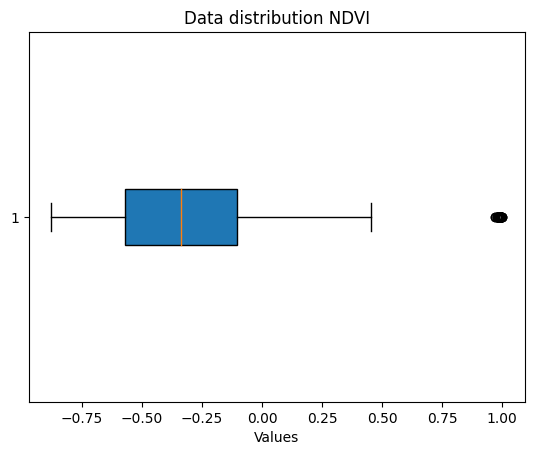

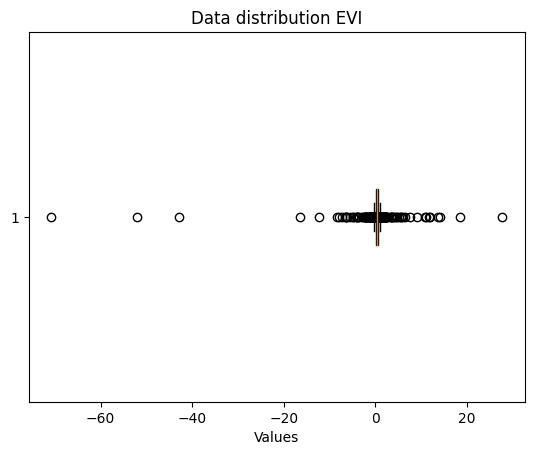

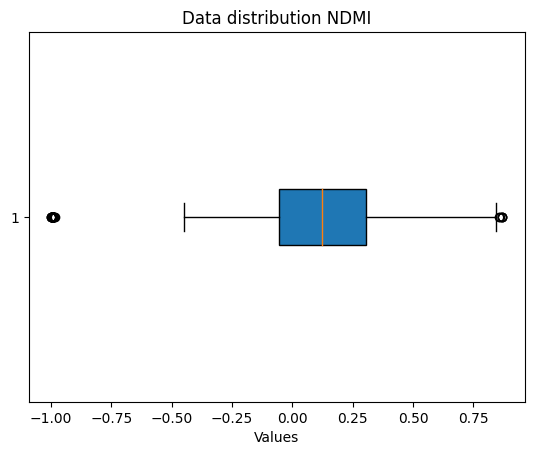

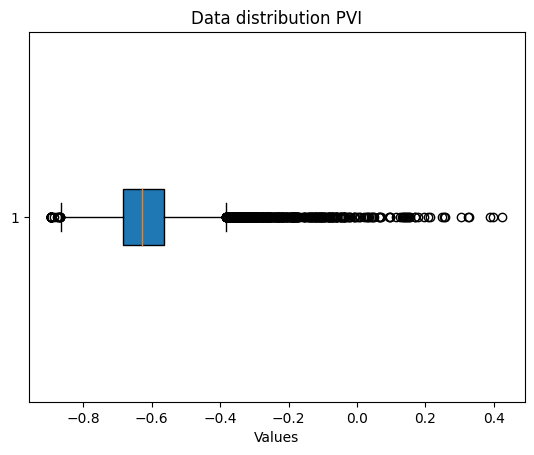

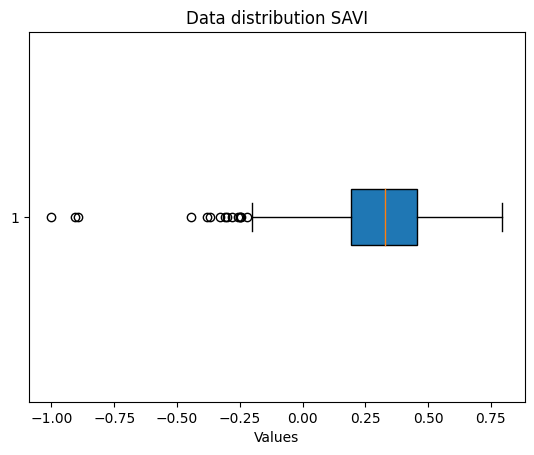

...

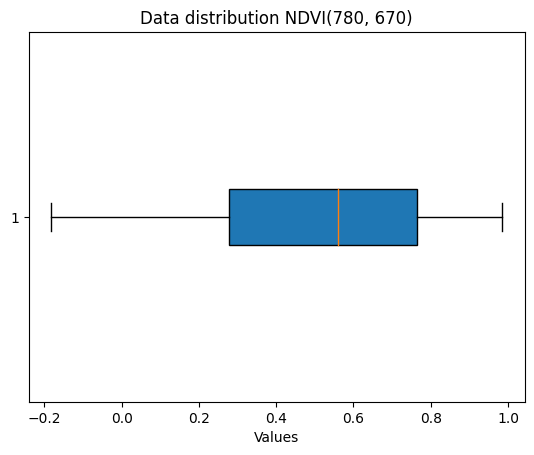

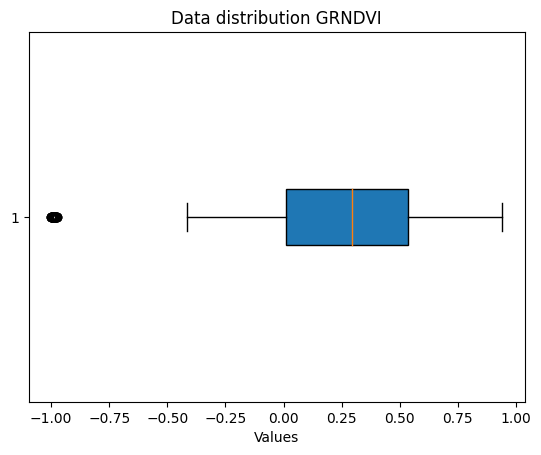

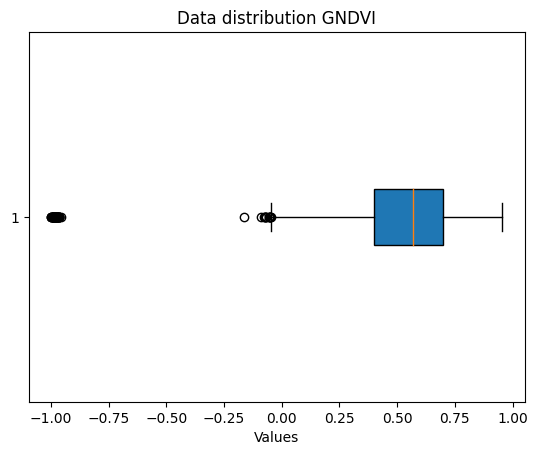

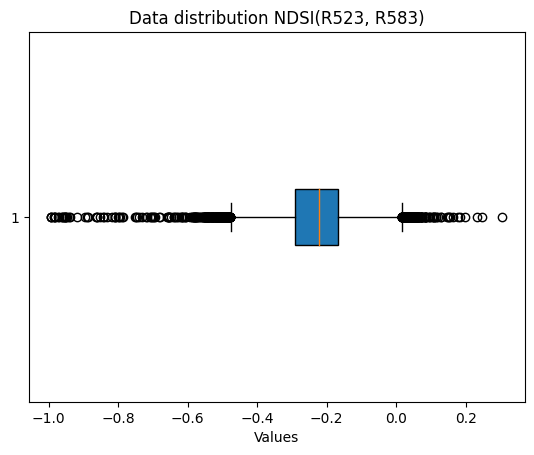

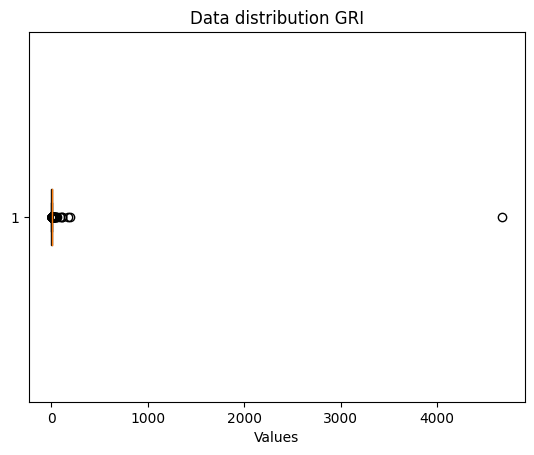

In [8]:
for svi in parser.get_indices():
    plt.figure()
    # Create a boxplot and obtain the summary statistics
    bp = plt.boxplot(mean_df[svi], vert=False, patch_artist=True)
    plt.title(f'Data distribution {svi}')
    plt.xlabel('Values')
    #plt.show()
    plt.savefig(f'./Data_evaluation/distribution/boxplots/svi/Boxplot_{svi}')

##### Nutrients outliers

Count number of SVI outliers with IQR method

In [ ]:
data = []

for nut in labels:
    Q1 = df[nut].quantile(0.25)
    Q3 = df[nut].quantile(0.75)
    # Calculate interquartile range (IQR)
    IQR = Q3 - Q1
    # Define lower and upper bounds for outliers
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    # Count outliers
    data.append(df[nut][(df[nut] < lower_bound) | (df[nut] > upper_bound)].count())

display(pd.DataFrame(data=data, columns=['# Outliers (IQR)'], index=labels))

df[labels].describe()

### Feature selection

Df with mean values

In [13]:
def mean(x):
    return [np.mean(r) for r in x]

mean_df = df.copy(deep=True)
mean_df[parser.get_features()] = mean_df[parser.get_features()].apply(mean, raw=True)
mean_df[parser.get_features()]

,NDVI,EVI,NDMI,PVI,SAVI,TSAVI,CL,Chlgreen,CIG,FE2,...,B:GREEN,B:RED,B:VNIR5,B:VNIR6,B:VNIR7,B:VNIR8,B:VNIR8a,B:SWIR9,B:SWIR11,B:SWIR12
0,-0.257779,0.446212,0.022382,-0.570712,0.419559,-0.142147,0.399368,0.272365,3.693495,1.555654,...,0.085350,0.095513,0.157250,0.264275,0.314869,0.361925,0.368837,0.366400,0.348544,0.215587
1,-0.636760,0.387526,0.337451,-0.711445,0.381955,-0.311351,0.065491,0.147810,6.771465,1.817603,...,0.028208,0.018144,0.049588,0.151964,0.192132,0.204580,0.215680,0.220988,0.100412,0.044808
2,-0.479049,0.516492,0.188137,-0.602397,0.439989,-0.170742,0.075385,0.283890,3.009227,1.686067,...,0.086700,0.065000,0.127600,0.271700,0.305400,0.326500,0.347600,0.350900,0.223100,0.115000
3,-0.362139,0.376530,0.136499,-0.675993,0.350927,-0.257633,0.205713,0.297733,2.593119,1.741272,...,0.070033,0.055750,0.109233,0.211200,0.236450,0.244217,0.252283,0.252800,0.183183,0.112433
4,-0.040084,0.188811,-0.032949,-0.653630,0.191109,-0.230385,0.507038,0.435438,1.656888,1.750445,...,0.110060,0.152240,0.194192,0.238692,0.258652,0.269220,0.275884,0.300928,0.286616,0.250024
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16126,-0.564692,0.705238,0.296337,-0.479077,0.623728,-0.044813,0.267660,0.145810,6.322694,1.765010,...,0.065152,0.044368,0.114400,0.367504,0.448844,0.464376,0.476280,0.461284,0.251676,0.129148
16127,-0.715605,0.420913,0.475542,-0.708494,0.402840,-0.306188,-0.506152,0.118595,8.307555,2.034863,...,0.022396,0.013016,0.046748,0.157380,0.187036,0.207880,0.204920,0.200220,0.075376,0.035424
16128,-0.675827,0.427938,0.422810,-0.679837,0.413385,-0.262263,0.184392,0.157749,5.953911,1.511042,...,0.037006,0.028100,0.062288,0.183712,0.235000,0.239919,0.256731,0.241231,0.097131,0.046269
16129,0.074773,0.142933,-0.226404,-0.709950,0.150211,-0.295901,0.467238,0.463976,1.519242,1.866281,...,0.086400,0.123056,0.144960,0.167884,0.186376,0.206252,0.217596,0.217908,0.326352,0.239020


to keep feature score's 

In [39]:
f_score = {f: 0 for f in parser.get_features()}
f_score

{'EVI': 0,
 'NDMI': 0,
 'PVI': 0,
 'SAVI': 0,
 'TSAVI': 0,
 'CL': 0,
 'Chlgreen': 0,
 'CIG': 0,
 'FE2': 0,
 'TCARI': 0,
 'MCARI': 0,
 'CCCI': 0,
 'NDRE': 0,
 'CIrededge': 0,
 'CVI': 0,
 'GSAVI': 0,
 'MSAVI': 0,
 'RDVI': 0,
 'WDRVI': 0,
 'NDSI': 0,
 'RSI(1385, 1705)': 0,
 'DSI(R1705, R1385)': 0,
 'NDVI(780, 670)': 0,
 'GRNDVI': 0,
 'GNDVI': 0,
 'NDSI(R523, R583)': 0,
 'GRI': 0,
 'NDVI': 0,
 'B:UB': 0,
 'B:BLUE': 0,
 'B:GREEN': 0,
 'B:RED': 0,
 'B:VNIR5': 0,
 'B:VNIR6': 0,
 'B:VNIR7': 0,
 'B:VNIR8': 0,
 'B:VNIR8a': 0,
 'B:SWIR9': 0,
 'B:SWIR11': 0,
 'B:SWIR12': 0}

#### Correlation

In [14]:
corr_threshold = 0.9

##### Bands correlation

In [41]:
bands_corr_df = mean_df[list(parser.get_bands().keys())].corr()
bands_corr_df[bands_corr_df.abs() < corr_threshold]

,B:UB,B:BLUE,B:GREEN,B:RED,B:VNIR5,B:VNIR6,B:VNIR7,B:VNIR8,B:VNIR8a,B:SWIR9,B:SWIR11,B:SWIR12
B:UB,NaN,NaN,NaN,NaN,NaN,0.797959,0.689702,0.667009,0.647198,0.832009,0.583042,0.620299
B:BLUE,NaN,NaN,NaN,NaN,NaN,0.806348,0.691896,0.681475,0.649297,0.819634,0.635189,0.667157
B:GREEN,NaN,NaN,NaN,NaN,NaN,0.839729,0.724346,0.711020,0.685571,0.826861,0.709447,0.734351
B:RED,NaN,NaN,NaN,NaN,NaN,0.776239,0.646407,0.632114,0.612833,0.747469,0.802466,0.835355
B:VNIR5,NaN,NaN,NaN,NaN,NaN,0.840199,0.721329,0.706188,0.693172,0.800094,0.815815,0.828706
B:VNIR6,0.797959,0.806348,0.839729,0.776239,0.840199,NaN,NaN,NaN,NaN,NaN,0.640162,0.580373
B:VNIR7,0.689702,0.691896,0.724346,0.646407,0.721329,NaN,NaN,NaN,NaN,0.898424,0.545881,0.464524
B:VNIR8,0.667009,0.681475,0.711020,0.632114,0.706188,NaN,NaN,NaN,NaN,0.879493,0.537910,0.449792
B:VNIR8a,0.647198,0.649297,0.685571,0.612833,0.693172,NaN,NaN,NaN,NaN,0.882310,0.551181,0.454661
B:SWIR9,0.832009,0.819634,0.826861,0.747469,0.800094,NaN,0.898424,0.879493,0.882310,NaN,0.563151,0.529112


In [ ]:
# Set up the matplotlib figure
plt.figure(figsize=(8, 6))
mask = np.triu(np.ones_like(bands_corr_df))
# Show the plot
plt.title("Bands correlation")
sns.heatmap(bands_corr_df[bands_corr_df.abs() <= corr_threshold], annot=True, cmap="coolwarm", linewidths=0.7, mask=mask)
plt.show()

##### Indices correlation

In [28]:
indices_corr_df = mean_df[parser.get_indices()].corr()
important_indices_corr_df = indices_corr_df[indices_corr_df.abs() < corr_threshold].loc[
    ['GNDVI', 'GRNDVI', 'GSAVI', 'MCARI', 'NDVI(780, 670)', 'TSAVI', 'WDRVI'],
    ['GNDVI', 'GRNDVI', 'GSAVI', 'MCARI', 'NDVI(780, 670)', 'TSAVI', 'WDRVI']
]
important_indices_corr_df

,GNDVI,GRNDVI,GSAVI,MCARI,"NDVI(780, 670)",TSAVI,WDRVI
GNDVI,NaN,NaN,0.844344,0.592121,0.877059,0.099212,0.871431
GRNDVI,NaN,NaN,0.839533,0.689043,NaN,0.127758,NaN
GSAVI,0.844344,0.839533,NaN,0.747623,0.792373,0.519194,0.790060
MCARI,0.592121,0.689043,0.747623,NaN,0.719480,0.495693,0.747463
"NDVI(780, 670)",0.877059,NaN,0.792373,0.719480,NaN,0.084581,NaN
TSAVI,0.099212,0.127758,0.519194,0.495693,0.084581,NaN,0.183907
WDRVI,0.871431,NaN,0.790060,0.747463,NaN,0.183907,NaN


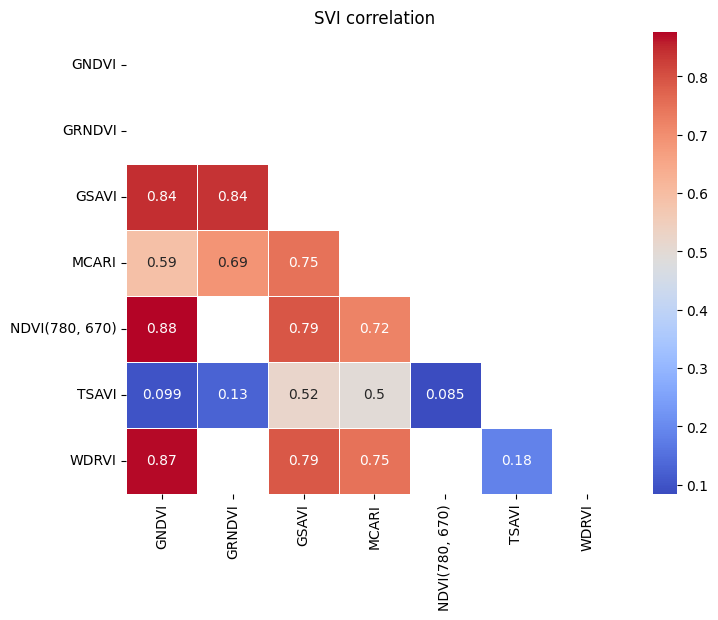

In [31]:
# Set up the matplotlib figure
plt.figure(figsize=(8, 6))
mask = np.triu(np.ones_like(important_indices_corr_df))
# Show the plot
plt.title("SVI correlation")
sns.heatmap(important_indices_corr_df[important_indices_corr_df.abs() <= corr_threshold], annot=True, cmap="coolwarm", linewidths=0.7, mask=mask)
plt.show()

In [48]:
losers = ('NDMI', 'GSAVI', 'MSAVI')
for svi in set(parser.get_indices()).difference(losers):
    f_score[svi] += 1

#### Recursive feature elimination

It is hard to select the features with most importance.

So, we train a feature selector model that tells which ones give the highest accuracy.

In [54]:
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFECV 


feature_selector = RFECV(LinearRegression())

Data = mean_df.dropna(subset=['P'])
X, Y = Data[parser.get_features()].to_numpy(), Data['P'].to_numpy()
fit = feature_selector.fit(X, Y)

selected_f = feature_selector.get_feature_names_out(parser.get_features())
print(f"Found {feature_selector.n_features_} optimal features for label P")
print(f'Removed: {set(parser.get_features()).difference(set(selected_f))}\n')

Found 25 optimal features for label P
Removed: {'CVI', 'EVI', 'FE2', 'B:BLUE', 'PVI', 'B:SWIR12', 'CIrededge', 'NDSI', 'GRI', 'CCCI', 'CL', 'RSI(1385, 1705)', 'Chlgreen', 'NDSI(R523, R583)', 'CIG'}



In [55]:
for f in selected_f:
    f_score[f] += 1
f_score

{'EVI': 1,
 'NDMI': 1,
 'PVI': 1,
 'SAVI': 2,
 'TSAVI': 2,
 'CL': 1,
 'Chlgreen': 1,
 'CIG': 1,
 'FE2': 1,
 'TCARI': 2,
 'MCARI': 2,
 'CCCI': 1,
 'NDRE': 2,
 'CIrededge': 1,
 'CVI': 1,
 'GSAVI': 1,
 'MSAVI': 1,
 'RDVI': 2,
 'WDRVI': 2,
 'NDSI': 1,
 'RSI(1385, 1705)': 1,
 'DSI(R1705, R1385)': 2,
 'NDVI(780, 670)': 2,
 'GRNDVI': 2,
 'GNDVI': 2,
 'NDSI(R523, R583)': 1,
 'GRI': 1,
 'NDVI': 2,
 'B:UB': 1,
 'B:BLUE': 0,
 'B:GREEN': 1,
 'B:RED': 2,
 'B:VNIR5': 1,
 'B:VNIR6': 1,
 'B:VNIR7': 1,
 'B:VNIR8': 2,
 'B:VNIR8a': 1,
 'B:SWIR9': 2,
 'B:SWIR11': 1,
 'B:SWIR12': 1}

#### Principal component analysis

In [62]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Standardize the data
scaled_data = StandardScaler().fit_transform(mean_df[parser.get_features()])

# Apply PCA with five components
num_components = 25
pca = PCA(n_components=num_components)
pca_result = pca.fit_transform(scaled_data)

# Get the loadings for each original feature on PC1 to PC25
loadings_df = pd.DataFrame(data=pca.components_.T,
                           columns=[f'PC{i+1}' for i in range(num_components)],
                           index=parser.get_features()
                        )

# Display the top features for each principal component
for i in range(num_components):
    pc_column = f'PC{i+1}'
    top_features = loadings_df[pc_column].abs().sort_values(ascending=False).index
    print(f"Top feature for {pc_column}: {top_features[0]}")

Top feature for PC1: GRNDVI
Top feature for PC2: B:VNIR8
Top feature for PC3: RSI(1385, 1705)
Top feature for PC4: CVI
Top feature for PC5: FE2
Top feature for PC6: CCCI
Top feature for PC7: CL
Top feature for PC8: EVI
Top feature for PC9: CIG
Top feature for PC10: Chlgreen
Top feature for PC11: Chlgreen
Top feature for PC12: NDSI(R523, R583)
Top feature for PC13: RSI(1385, 1705)
Top feature for PC14: CVI
Top feature for PC15: B:SWIR9
Top feature for PC16: NDSI
Top feature for PC17: MCARI
Top feature for PC18: RSI(1385, 1705)
Top feature for PC19: NDVI(780, 670)
Top feature for PC20: GNDVI
Top feature for PC21: TSAVI
Top feature for PC22: B:UB
Top feature for PC23: WDRVI
Top feature for PC24: NDVI(780, 670)
Top feature for PC25: GSAVI


'GRNDVI', 'B:VNIR8', 'RSI(1385, 1705)', 'CVI', 'FE2', 'CCCI', 'CL', 'EVI', 'CIG', 'Chlgreen', 'NDSI(R523, R583)', 'B:SWIR9', 'NDSI', 'MCARI', 'GNDVI', 'TSAVI', 'B:UB', 'WDRVI', 'NDVI(780, 670)', 'GSAVI'

In [63]:
winners = (
    'GRNDVI', 'B:VNIR8', 'RSI(1385, 1705)', 'CVI', 'FE2', 'CCCI', 'CL', 'EVI', 'CIG',
    'Chlgreen', 'NDSI(R523, R583)', 'B:SWIR9', 'NDSI', 'MCARI', 'GNDVI', 'TSAVI',
    'B:UB', 'WDRVI', 'NDVI(780, 670)', 'GSAVI'
)

for f in winners:
    f_score[f] += 1

In [11]:
losers_RFE = ['CVI', 'EVI', 'FE2', 'B:BLUE', 'PVI', 'B:SWIR12', 'CIrededge', 'NDSI', 'GRI', 'CCCI', 'CL', 'RSI(1385, 1705)', 'Chlgreen', 'NDSI(R523, R583)', 'CIG']
winners_PCA = ['GRNDVI', 'B:VNIR8', 'RSI(1385, 1705)', 'CVI', 'FE2', 'CCCI', 'CL', 'EVI', 'CIG',
    'Chlgreen', 'NDSI(R523, R583)', 'B:SWIR9', 'NDSI', 'MCARI', 'GNDVI', 'TSAVI',
    'B:UB', 'WDRVI', 'NDVI(780, 670)', 'GSAVI']
winners_RFE = set(parser.get_features()).difference(losers_RFE)
winners_PCA_RFE = set(winners_PCA).intersection(winners_RFE)
winners_PCA_RFE

{'B:SWIR9',
 'B:UB',
 'B:VNIR8',
 'GNDVI',
 'GRNDVI',
 'GSAVI',
 'MCARI',
 'NDVI(780, 670)',
 'TSAVI',
 'WDRVI'}

#### Final score

In [64]:
max_value = max(f_score.values())
# Find all keys with the maximum value
[k for k, v in f_score.items() if v == max_value]

['TSAVI',
 'MCARI',
 'WDRVI',
 'NDVI(780, 670)',
 'GRNDVI',
 'GNDVI',
 'B:VNIR8',
 'B:SWIR9']

In [65]:
f_score

{'EVI': 2,
 'NDMI': 1,
 'PVI': 1,
 'SAVI': 2,
 'TSAVI': 3,
 'CL': 2,
 'Chlgreen': 2,
 'CIG': 2,
 'FE2': 2,
 'TCARI': 2,
 'MCARI': 3,
 'CCCI': 2,
 'NDRE': 2,
 'CIrededge': 1,
 'CVI': 2,
 'GSAVI': 2,
 'MSAVI': 1,
 'RDVI': 2,
 'WDRVI': 3,
 'NDSI': 2,
 'RSI(1385, 1705)': 2,
 'DSI(R1705, R1385)': 2,
 'NDVI(780, 670)': 3,
 'GRNDVI': 3,
 'GNDVI': 3,
 'NDSI(R523, R583)': 2,
 'GRI': 1,
 'NDVI': 2,
 'B:UB': 2,
 'B:BLUE': 0,
 'B:GREEN': 1,
 'B:RED': 2,
 'B:VNIR5': 1,
 'B:VNIR6': 1,
 'B:VNIR7': 1,
 'B:VNIR8': 3,
 'B:VNIR8a': 1,
 'B:SWIR9': 3,
 'B:SWIR11': 1,
 'B:SWIR12': 1}

## Experiment

### Local experiments

df checking

In [ ]:
print(parser.get_features())
parser.get_df()

Model Selection

In [ ]:
# Available models
cnb = tstk.ComplementNB(verbose=True)
hgb = tstk.estimators.HGradientBoosting(verbose=True)
knn = tstk.estimators.KNN(verbose=True)
mlp = tstk.estimators.MLPClassifier(max_iter=int(1e5), verbose=True, early_stopping=True,
                                    tol=0.01, n_iter_no_change=10)
sl = [cnb, hgb, knn, mlp]

ssl = [
    tstk.estimators.SelfTraining(base_estimator=ComplementNB(), verbose=True),
    tstk.estimators.SelfTraining(base_estimator=HistGradientBoostingClassifier(), verbose=True),
    tstk.estimators.SelfTraining(base_estimator=KNeighborsClassifier(), verbose=True),
    tstk.estimators.SelfTraining(verbose=True,
                                 base_estimator=MLPClassifier(max_iter=int(1e5), early_stopping=True,
                                                              tol=0.01, n_iter_no_change=10))
]


exp = tstk.Experiment(
    name='P_all_f',
    parser=parser,
    models=sl+ssl,
    y='P',
    cv=tstk.StratifiedKFold(),
    verbose=True
)

Model fitting and prediction

In [ ]:
results = exp.execute(
    parameter_optimization=True,
    n_trials=10,
    save_results='./Data_evaluation/results/'
)

Model evaluation

In [ ]:
exp.calculate_metrics(metrics=['acc', 'prec', 'f1', 'recall'])

### From results

In [47]:

main_exp = 'P_RWselected_f'
core_experiment = f'./Data_evaluation/results/{main_exp}/'
sub_experiments = (
    main_exp,
    'wheat',
    '5%_Xl_Balanced/run0',
    '5%_Xl_Balanced/run2',
    '5%_Xl_Balanced/run3',
    '5%_Xl_Balanced/run4',
    '25%_Xl_Balanced/run0',
    '25%_Xl_Balanced/run1',
    '25%_Xl_Balanced/run2',
    '25%_Xl_Balanced/run3',
    '25%_Xl_Balanced/run4',
    '50%_Xl_Balanced/run0',
    '50%_Xl_Balanced/run3',
    '50%_Xl_Balanced/run4',
    '75%_Xl_Balanced/run0',
    '75%_Xl_Balanced/run2',
    '75%_Xl_Balanced/run3',
    '75%_Xl_Balanced/run4',
    '100%_Xl_Balanced/run0',
    '100%_Xl_Balanced/run1',
    '100%_Xl_Balanced/run2',
    '100%_Xl_Balanced/run3',
    '100%_Xl_Balanced/run4'
)


for sub_e in sub_experiments:
    f = core_experiment + sub_e
    print(f'Experiment: {sub_e}')
    display(pickle.load(open(f'{f}/Df_metrics.pickle', 'rb')))

Experiment: P_RWselected_f


,algorithm,acc,ball_acc,f1,prec,recall
0,ComplementNB,0.49098,0.50380,0.35370,0.26962,0.54224
1,HGradientBoosting,0.66696,0.49988,0.00050,0.06666,0.00026
2,KNN,0.62176,0.50298,0.20628,0.34222,0.14778
3,RandomForest,0.64928,0.51282,0.16570,0.39752,0.10482
4,AdaBoosting,0.64902,0.51194,0.16204,0.39436,0.10200
5,SelfTraining_ComplementNB,0.59806,0.49840,0.10338,0.22744,0.20050
6,SelfTraining_HistGradientBoostingClassifier,0.65648,0.50774,0.10884,0.39914,0.06310
7,SelfTraining_KNeighborsClassifier,0.61146,0.50180,0.22960,0.33738,0.17402
8,SelfTraining_RandomForestClassifier,0.65664,0.50598,0.09684,0.38676,0.05546
9,SelfTraining_AdaBoostClassifier,0.66436,0.50306,0.03970,0.41852,0.02088


Experiment: wheat


,algorithm,acc,ball_acc,f1,prec,recall
0,ComplementNB,0.57722,0.51410,0.203275,0.29166,0.15600
1,HGradientBoosting,0.50820,0.48492,0.372042,0.39286,0.35332
2,KNN,0.58870,0.50000,NaN,0.00000,0.00000
3,RandomForest,0.54026,0.50068,0.332047,0.41324,0.27752
4,AdaBoosting,0.50410,0.49460,0.422365,0.40514,0.44112
5,SelfTraining_ComplementNB,0.57312,0.51124,0.206035,0.28926,0.16000
6,SelfTraining_HistGradientBoostingClassifier,0.52136,0.48794,0.339191,0.39118,0.29940
7,SelfTraining_KNeighborsClassifier,0.55664,0.52360,0.384693,0.44758,0.33730
8,SelfTraining_RandomForestClassifier,0.54598,0.50548,0.334767,0.42200,0.27742
9,SelfTraining_AdaBoostClassifier,0.56730,0.52486,0.352208,0.45980,0.28542


Experiment: 5%_Xl_Balanced/run0


,algorithm,acc,ball_acc,f1,prec,recall
0,ComplementNB,0.51270,0.51294,0.670651,0.50708,0.99000
1,HGradientBoosting,0.48728,0.48730,0.493807,0.49048,0.49718
2,KNN,0.46686,0.46680,0.464296,0.46682,0.46180
3,RandomForest,0.44404,0.44402,0.465953,0.45080,0.48216
4,AdaBoosting,0.47728,0.47776,0.491328,0.48024,0.50294
5,SelfTraining_HistGradientBoostingClassifier,0.47980,0.48038,0.498813,0.48048,0.51860
6,SelfTraining_KNeighborsClassifier,0.46194,0.46200,0.472692,0.46370,0.48204
7,SelfTraining_RandomForestClassifier,0.44432,0.44474,0.472516,0.44966,0.49782
8,SelfTraining_AdaBoostClassifier,0.48746,0.48698,0.449261,0.48756,0.41654


Experiment: 5%_Xl_Balanced/run2


,algorithm,acc,ball_acc,f1,prec,recall
0,ComplementNB,0.49748,0.49666,0.648433,0.49822,0.92832
1,HGradientBoosting,0.49754,0.49750,0.493887,0.50038,0.48756
2,KNN,0.52284,0.52440,0.597819,0.50936,0.72346
3,RandomForest,0.48968,0.48974,0.479265,0.48682,0.47194
4,AdaBoosting,0.50004,0.49986,0.514640,0.49766,0.53282
5,SelfTraining_ComplementNB,0.50000,0.49994,0.019265,0.20000,0.01012
6,SelfTraining_HistGradientBoostingClassifier,0.48478,0.48506,0.488273,0.48406,0.49256
7,SelfTraining_KNeighborsClassifier,0.47978,0.47968,0.485994,0.48430,0.48770
8,SelfTraining_RandomForestClassifier,0.50234,0.50152,0.501650,0.50188,0.50142
9,SelfTraining_AdaBoostClassifier,0.44148,0.44128,0.477365,0.45086,0.50718


Experiment: 5%_Xl_Balanced/run3


,algorithm,acc,ball_acc,f1,prec,recall
0,ComplementNB,0.51012,0.51020,0.671326,0.50526,1.00000
1,HGradientBoosting,0.43410,0.43474,0.431194,0.43568,0.42680
2,KNN,0.48466,0.48642,0.538606,0.48758,0.60156
3,RandomForest,0.48982,0.49006,0.479441,0.48678,0.47232
4,AdaBoosting,0.45412,0.45468,0.447120,0.44708,0.44716
5,SelfTraining_HistGradientBoostingClassifier,0.47196,0.47258,0.472550,0.47240,0.47270
6,SelfTraining_KNeighborsClassifier,0.53772,0.53716,0.557256,0.53384,0.58282
7,SelfTraining_RandomForestClassifier,0.50236,0.50314,0.504552,0.50082,0.50834
8,SelfTraining_AdaBoostClassifier,0.50524,0.50660,0.513603,0.50304,0.52462


Experiment: 5%_Xl_Balanced/run4


,algorithm,acc,ball_acc,f1,prec,recall
0,ComplementNB,0.51280,0.51270,0.459312,0.51088,0.41720
1,HGradientBoosting,0.55080,0.55116,0.550146,0.55158,0.54872
2,KNN,0.54556,0.54566,0.535808,0.54948,0.52280
3,RandomForest,0.55080,0.55116,0.548701,0.55934,0.53846
4,AdaBoosting,0.51272,0.51288,0.506622,0.51574,0.49782
5,SelfTraining_HistGradientBoostingClassifier,0.50000,0.50096,0.516303,0.50422,0.52898
6,SelfTraining_KNeighborsClassifier,0.51240,0.51244,0.507865,0.51902,0.49718
7,SelfTraining_RandomForestClassifier,0.55058,0.55072,0.537288,0.55858,0.51756
8,SelfTraining_AdaBoostClassifier,0.49230,0.49262,0.489736,0.49698,0.48270


Experiment: 25%_Xl_Balanced/run0


,algorithm,acc,ball_acc,f1,prec,recall
0,ComplementNB,0.50154,0.50142,0.511656,0.60696,0.44222
1,HGradientBoosting,0.50252,0.50256,0.509158,0.50172,0.51682
2,KNN,0.52698,0.52696,0.530460,0.52592,0.53508
3,RandomForest,0.48934,0.48934,0.486638,0.48906,0.48424
4,AdaBoosting,0.49546,0.49546,0.481827,0.49654,0.46796
5,SelfTraining_ComplementNB,0.50202,0.50204,0.666907,0.50104,0.99694
6,SelfTraining_HistGradientBoostingClassifier,0.49644,0.49644,0.486202,0.49672,0.47612
7,SelfTraining_KNeighborsClassifier,0.49796,0.49800,0.518295,0.49808,0.54022
8,SelfTraining_RandomForestClassifier,0.48932,0.48934,0.493887,0.48934,0.49852
9,SelfTraining_AdaBoostClassifier,0.50000,0.49998,0.483545,0.50018,0.46798


Experiment: 25%_Xl_Balanced/run1


,algorithm,acc,ball_acc,f1,prec,recall
0,ComplementNB,0.50102,0.50102,0.004039,0.20000,0.00204
1,HGradientBoosting,0.51374,0.51370,0.530414,0.51364,0.54832
2,KNN,0.51324,0.51318,0.528629,0.51300,0.54524
3,RandomForest,0.53002,0.53000,0.534787,0.52952,0.54016
4,AdaBoosting,0.52950,0.52950,0.523026,0.53052,0.51574
5,SelfTraining_ComplementNB,0.50102,0.50100,0.667129,0.50052,1.00000
6,SelfTraining_HistGradientBoostingClassifier,0.52444,0.52442,0.518488,0.52656,0.51066
7,SelfTraining_KNeighborsClassifier,0.49390,0.49388,0.482378,0.49432,0.47100
8,SelfTraining_RandomForestClassifier,0.53868,0.53862,0.537148,0.53820,0.53610
9,SelfTraining_AdaBoostClassifier,0.50304,0.50302,0.535970,0.50210,0.57474


Experiment: 25%_Xl_Balanced/run2


,algorithm,acc,ball_acc,f1,prec,recall
0,ComplementNB,0.50866,0.50858,0.297958,0.61860,0.19624
1,HGradientBoosting,0.48678,0.48676,0.492521,0.48768,0.49746
2,KNN,0.50556,0.50556,0.496944,0.50592,0.48828
3,RandomForest,0.51472,0.51474,0.505209,0.51648,0.49442
4,AdaBoosting,0.52136,0.52134,0.513481,0.52268,0.50460
5,SelfTraining_ComplementNB,0.50356,0.50356,0.668055,0.50182,0.99898
6,SelfTraining_HistGradientBoostingClassifier,0.51930,0.51926,0.532251,0.51896,0.54624
7,SelfTraining_KNeighborsClassifier,0.51170,0.51168,0.528915,0.51082,0.54834
8,SelfTraining_RandomForestClassifier,0.51220,0.51220,0.516940,0.51306,0.52088
9,SelfTraining_AdaBoostClassifier,0.50558,0.50542,0.586436,0.51230,0.68566


Experiment: 25%_Xl_Balanced/run3


,algorithm,acc,ball_acc,f1,prec,recall
0,ComplementNB,0.48984,0.49010,0.240152,0.28052,0.20994
1,HGradientBoosting,0.51016,0.51012,0.511561,0.50946,0.51368
2,KNN,0.48676,0.48662,0.446250,0.48278,0.41486
3,RandomForest,0.48524,0.48518,0.483959,0.48478,0.48314
4,AdaBoosting,0.48828,0.48826,0.473945,0.48784,0.46082
5,SelfTraining_ComplementNB,0.50152,0.50156,0.666905,0.50078,0.99796
6,SelfTraining_HistGradientBoostingClassifier,0.51880,0.51878,0.515254,0.51892,0.51164
7,SelfTraining_KNeighborsClassifier,0.49692,0.49684,0.500482,0.49752,0.50348
8,SelfTraining_RandomForestClassifier,0.50354,0.50346,0.480814,0.50274,0.46072
9,SelfTraining_AdaBoostClassifier,0.48270,0.48280,0.483805,0.48732,0.48034


Experiment: 25%_Xl_Balanced/run4


,algorithm,acc,ball_acc,f1,prec,recall
0,ComplementNB,0.50000,0.50000,NaN,0.00000,0.00000
1,HGradientBoosting,0.52544,0.52538,0.524380,0.52488,0.52388
2,KNN,0.51172,0.51178,0.581651,0.50894,0.67860
3,RandomForest,0.51678,0.51676,0.506925,0.51680,0.49742
4,AdaBoosting,0.51120,0.51112,0.509125,0.51068,0.50758
5,SelfTraining_ComplementNB,0.50152,0.50154,0.666922,0.50080,0.99796
6,SelfTraining_HistGradientBoostingClassifier,0.50916,0.50914,0.500377,0.50866,0.49236
7,SelfTraining_KNeighborsClassifier,0.52186,0.52184,0.506461,0.52252,0.49136
8,SelfTraining_RandomForestClassifier,0.52900,0.52896,0.533623,0.52728,0.54012
9,SelfTraining_AdaBoostClassifier,0.50408,0.50392,0.533883,0.50082,0.57162


Experiment: 50%_Xl_Balanced/run0


,algorithm,acc,ball_acc,f1,prec,recall
0,ComplementNB,0.50560,0.50574,0.555656,0.52130,0.59486
1,HGradientBoosting,0.52112,0.52110,0.531044,0.52032,0.54222
2,KNN,0.50358,0.50352,0.521039,0.50236,0.54116
3,RandomForest,0.50176,0.50174,0.500876,0.50230,0.49946
4,AdaBoosting,0.50890,0.50888,0.509198,0.50828,0.51012
5,SelfTraining_ComplementNB,0.49974,0.49950,0.222313,0.25026,0.19998
6,SelfTraining_HistGradientBoostingClassifier,0.52058,0.52058,0.524480,0.52052,0.52850
7,SelfTraining_KNeighborsClassifier,0.50814,0.50814,0.511442,0.50768,0.51526
8,SelfTraining_RandomForestClassifier,0.51014,0.51014,0.509957,0.51128,0.50864
9,SelfTraining_AdaBoostClassifier,0.51044,0.51044,0.517522,0.50984,0.52544


Experiment: 50%_Xl_Balanced/run3


,algorithm,acc,ball_acc,f1,prec,recall
0,ComplementNB,0.50204,0.50204,0.666988,0.50100,0.99746
1,HGradientBoosting,0.50586,0.50586,0.499906,0.50606,0.49390
2,KNN,0.48804,0.48806,0.461448,0.48698,0.43846
3,RandomForest,0.51934,0.51934,0.518666,0.52002,0.51732
4,AdaBoosting,0.52368,0.52366,0.517208,0.52494,0.50970
5,SelfTraining_ComplementNB,0.50204,0.50204,0.666988,0.50100,0.99746
6,SelfTraining_HistGradientBoostingClassifier,0.49796,0.49796,0.480444,0.49766,0.46438
7,SelfTraining_KNeighborsClassifier,0.49848,0.49848,0.496723,0.49858,0.49488
8,SelfTraining_RandomForestClassifier,0.51424,0.51424,0.504346,0.51470,0.49440
9,SelfTraining_AdaBoostClassifier,0.48244,0.48244,0.463265,0.47720,0.45012


Experiment: 50%_Xl_Balanced/run4


,algorithm,acc,ball_acc,f1,prec,recall
0,ComplementNB,0.50026,0.50026,0.000998,0.20000,0.00050
1,HGradientBoosting,0.50916,0.50914,0.520308,0.50910,0.53202
2,KNN,0.50380,0.50384,0.496213,0.50490,0.48782
3,RandomForest,0.49722,0.49722,0.492327,0.49750,0.48726
4,AdaBoosting,0.50330,0.50330,0.490406,0.50334,0.47812
5,SelfTraining_ComplementNB,0.50128,0.50128,0.666459,0.50066,0.99644
6,SelfTraining_HistGradientBoostingClassifier,0.50536,0.50536,0.500045,0.50580,0.49442
7,SelfTraining_KNeighborsClassifier,0.51704,0.51704,0.518892,0.51692,0.52088
8,SelfTraining_RandomForestClassifier,0.50890,0.50890,0.501929,0.50914,0.49492
9,SelfTraining_AdaBoostClassifier,0.50994,0.50990,0.505705,0.51052,0.50098


Experiment: 75%_Xl_Balanced/run0


,algorithm,acc,ball_acc,f1,prec,recall
0,ComplementNB,0.50018,0.50018,0.002035,0.40000,0.00102
1,HGradientBoosting,0.51510,0.51508,0.517013,0.51506,0.51898
2,KNN,0.50898,0.50898,0.487407,0.50956,0.46710
3,RandomForest,0.50696,0.50694,0.501687,0.50688,0.49660
4,AdaBoosting,0.51154,0.51156,0.506876,0.51216,0.50170
5,SelfTraining_ComplementNB,0.50138,0.50136,0.666606,0.50070,0.99694
6,SelfTraining_HistGradientBoostingClassifier,0.51646,0.51644,0.511920,0.51648,0.50744
7,SelfTraining_KNeighborsClassifier,0.52186,0.52186,0.520847,0.52204,0.51966
8,SelfTraining_RandomForestClassifier,0.50882,0.50884,0.500547,0.50916,0.49222
9,SelfTraining_AdaBoostClassifier,0.51664,0.51664,0.508806,0.51720,0.50068


Experiment: 75%_Xl_Balanced/run2


,algorithm,acc,ball_acc,f1,prec,recall
0,ComplementNB,0.50102,0.50100,0.666353,0.50050,0.99660
1,HGradientBoosting,0.52224,0.52220,0.533678,0.52148,0.54646
2,KNN,0.51136,0.51134,0.507254,0.51154,0.50304
3,RandomForest,0.50458,0.50456,0.494271,0.50490,0.48408
4,AdaBoosting,0.50782,0.50780,0.492254,0.50822,0.47726
5,SelfTraining_ComplementNB,0.50102,0.50100,0.666353,0.50050,0.99660
6,SelfTraining_HistGradientBoostingClassifier,0.51982,0.51982,0.509325,0.52122,0.49796
7,SelfTraining_KNeighborsClassifier,0.50830,0.50832,0.503793,0.50870,0.49898
8,SelfTraining_RandomForestClassifier,0.50730,0.50730,0.494820,0.50794,0.48236
9,SelfTraining_AdaBoostClassifier,0.51304,0.51306,0.499479,0.51246,0.48714


Experiment: 75%_Xl_Balanced/run3


,algorithm,acc,ball_acc,f1,prec,recall
0,ComplementNB,0.50000,0.50000,0.665816,0.49998,0.99626
1,HGradientBoosting,0.52138,0.52140,0.528095,0.52076,0.53564
2,KNN,0.51274,0.51270,0.465621,0.51580,0.42434
3,RandomForest,0.51154,0.51154,0.510045,0.51162,0.50848
4,AdaBoosting,0.50762,0.50764,0.499937,0.50790,0.49222
5,SelfTraining_ComplementNB,0.50000,0.50000,0.665816,0.49998,0.99626
6,SelfTraining_HistGradientBoostingClassifier,0.51256,0.51256,0.503179,0.51318,0.49356
7,SelfTraining_KNeighborsClassifier,0.49916,0.49916,0.499420,0.49916,0.49968
8,SelfTraining_RandomForestClassifier,0.51222,0.51222,0.499665,0.51252,0.48744
9,SelfTraining_AdaBoostClassifier,0.51678,0.51680,0.507407,0.51722,0.49796


Experiment: 75%_Xl_Balanced/run4


,algorithm,acc,ball_acc,f1,prec,recall
0,ComplementNB,0.50000,0.50000,NaN,0.00000,0.00000
1,HGradientBoosting,0.51680,0.51682,0.524201,0.51642,0.53222
2,KNN,0.50914,0.50916,0.491928,0.51020,0.47492
3,RandomForest,0.50052,0.50048,0.494909,0.50046,0.48948
4,AdaBoosting,0.50016,0.50018,0.500808,0.49994,0.50168
5,SelfTraining_HistGradientBoostingClassifier,0.49746,0.49744,0.491753,0.49754,0.48610
6,SelfTraining_KNeighborsClassifier,0.50372,0.50372,0.498454,0.50378,0.49324
7,SelfTraining_RandomForestClassifier,0.50646,0.50644,0.499306,0.50698,0.49186
8,SelfTraining_AdaBoostClassifier,0.51358,0.51356,0.496879,0.51462,0.48032


Experiment: 100%_Xl_Balanced/run0


,algorithm,acc,ball_acc,f1,prec,recall
0,ComplementNB,0.50024,0.50040,0.286204,0.49988,0.20050
1,HGradientBoosting,0.51960,0.51958,0.526732,0.51896,0.53474
2,KNN,0.51680,0.51678,0.473417,0.52002,0.43448
3,RandomForest,0.51552,0.51552,0.513540,0.51578,0.51132
4,AdaBoosting,0.51490,0.51490,0.505092,0.51556,0.49504


Experiment: 100%_Xl_Balanced/run1


,algorithm,acc,ball_acc,f1,prec,recall
0,ComplementNB,0.50050,0.50052,0.002512,0.40000,0.00126
1,HGradientBoosting,0.51668,0.51668,0.521848,0.51620,0.52762
2,KNN,0.50726,0.50726,0.512096,0.50688,0.51742
3,RandomForest,0.50916,0.50916,0.502567,0.50950,0.49582
4,AdaBoosting,0.50726,0.50726,0.511441,0.50704,0.51592


Experiment: 100%_Xl_Balanced/run2


,algorithm,acc,ball_acc,f1,prec,recall
0,ComplementNB,0.50126,0.50126,0.666499,0.50064,0.99670
1,HGradientBoosting,0.51922,0.51922,0.531317,0.51816,0.54516
2,KNN,0.51388,0.51386,0.518502,0.51358,0.52352
3,RandomForest,0.51006,0.51004,0.503034,0.51046,0.49582
4,AdaBoosting,0.50980,0.50980,0.510618,0.50966,0.51158


Experiment: 100%_Xl_Balanced/run3


,algorithm,acc,ball_acc,f1,prec,recall
0,ComplementNB,0.50050,0.50052,0.002512,0.40000,0.00126
1,HGradientBoosting,0.52444,0.52444,0.537027,0.52306,0.55176
2,KNN,0.50918,0.50918,0.509679,0.50906,0.51030
3,RandomForest,0.51222,0.51222,0.501642,0.51280,0.49096
4,AdaBoosting,0.50698,0.50700,0.510157,0.50676,0.51360


Experiment: 100%_Xl_Balanced/run4


,algorithm,acc,ball_acc,f1,prec,recall
0,ComplementNB,0.50126,0.50126,0.666499,0.50064,0.99670
1,HGradientBoosting,0.51842,0.51842,0.527015,0.51786,0.53650
2,KNN,0.52138,0.52136,0.498119,0.52370,0.47492
3,RandomForest,0.50698,0.50700,0.494612,0.50726,0.48258
4,AdaBoosting,0.50990,0.50990,0.510778,0.50974,0.51182


chosing the best run

In [70]:
# Core experiment directories
core_experiments = (
    './Data_evaluation/results/P_all_f/',
    './Data_evaluation/results/P_RWselected_f/',
    './Data_evaluation/results/P_fs(all)/'
)

sub_experiments_with_runs = (
    '5%_Xl_Balanced',
    '25%_Xl_Balanced',
    '50%_Xl_Balanced',
    '75%_Xl_Balanced',
    '100%_Xl_Balanced'
)

best_run_mapping = {exp: {sub_e: (None, 0) for sub_e in sub_experiments} for exp in core_experiments}

for exp in core_experiments:
    for sub_e in sub_experiments_with_runs:
        
        best_run, best_run_value = None, 0
        
        for run in range(5):
            file_path = f'{exp + sub_e}/run{run}'
            
            if os.path.exists(file_path):    
                df = pickle.load(open(f'{file_path}/Df_metrics.pickle', 'rb'))
                avg_ball_acc, avg_f1 = df[['ball_acc', 'f1']].mean()
                final_avg = (avg_ball_acc + avg_f1) / 2
                
                if final_avg > best_run_value:
                    best_run_value = final_avg
                    best_run = run
        
        best_run_mapping[exp][sub_e] = (best_run, best_run_value)

for exp in best_run_mapping.keys():
    for sub_e in best_run_mapping[exp].keys():
        if best_run_mapping[exp][sub_e][0] is not None:
            print(exp, sub_e, best_run_mapping[exp][sub_e])

./Data_evaluation/results/P_all_f/ 100%_Xl_Balanced (1, 0.5302687317121006)
./Data_evaluation/results/P_all_f/ 75%_Xl_Balanced (3, 0.5221791116974344)
./Data_evaluation/results/P_all_f/ 5%_Xl_Balanced (3, 0.5289168424520714)
./Data_evaluation/results/P_all_f/ 50%_Xl_Balanced (4, 0.5115442423977545)
./Data_evaluation/results/P_all_f/ 25%_Xl_Balanced (4, 0.5147585866763725)
./Data_evaluation/results/P_RWselected_f/ 100%_Xl_Balanced (2, 0.5284150379392103)
./Data_evaluation/results/P_RWselected_f/ 75%_Xl_Balanced (2, 0.523198938925835)
./Data_evaluation/results/P_RWselected_f/ 5%_Xl_Balanced (4, 0.5212267851503825)
./Data_evaluation/results/P_RWselected_f/ 50%_Xl_Balanced (2, 0.5299815289965035)
./Data_evaluation/results/P_RWselected_f/ 25%_Xl_Balanced (4, 0.5267079415254454)
./Data_evaluation/results/P_fs(all)/ 100%_Xl_Balanced (0, 0.4636980420125811)
./Data_evaluation/results/P_fs(all)/ 75%_Xl_Balanced (1, 0.5221201756110898)
./Data_evaluation/results/P_fs(all)/ 5%_Xl_Balanced (1, 0.517

AVG BALANCED ACCURACY OF EACH MODEL PER SUB EXPERIMENT

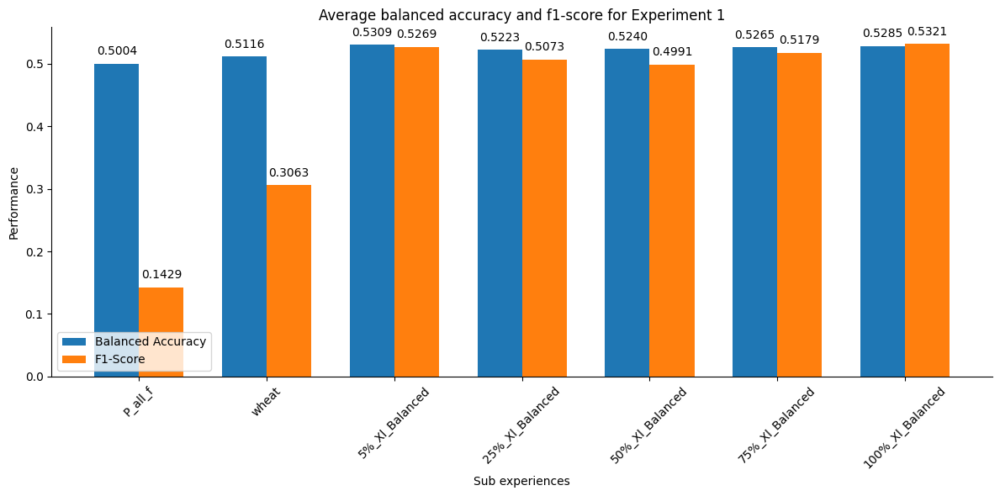

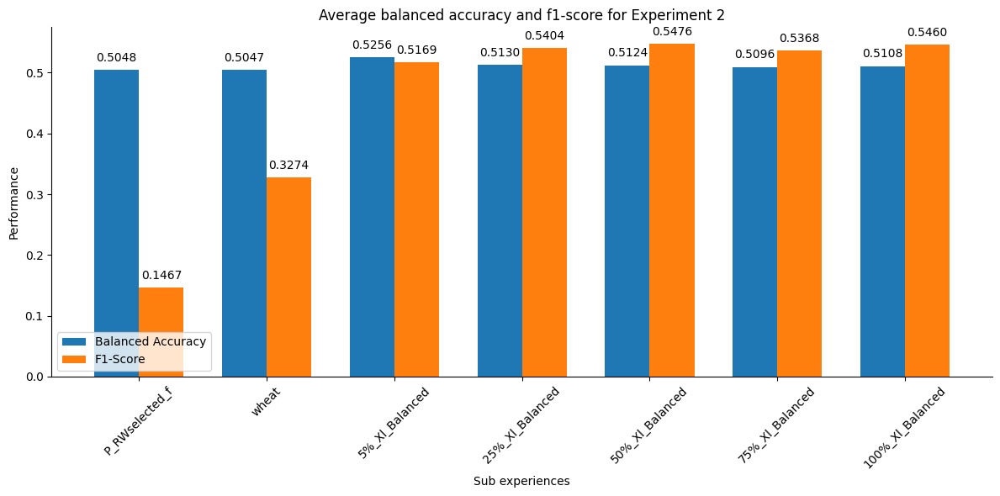

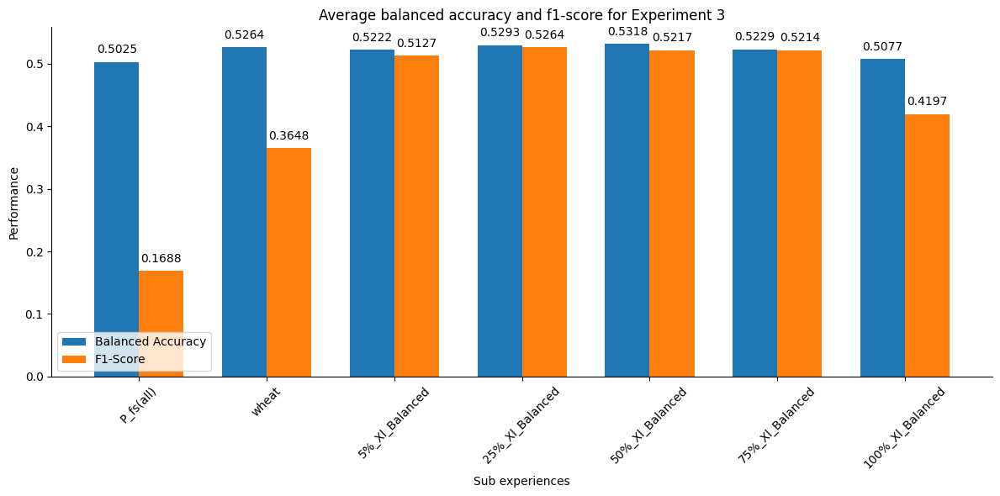

In [54]:
main_names = ('P_all_f', 'P_RWselected_f', 'P_fs(all)')

# Core experiment directories and files
core_experiments = (
    './Data_evaluation/results/P_all_f/',
    './Data_evaluation/results/P_RWselected_f/',
    './Data_evaluation/results/P_fs(all)/'
)

# Plotting
for exp, core_experiment in enumerate(core_experiments):

    sub_experiments = (
        main_names[exp],
        'wheat',
        '5%_Xl_Balanced',
        '25%_Xl_Balanced',
        '50%_Xl_Balanced',
        '75%_Xl_Balanced',
        '100%_Xl_Balanced'
    )
    indices = np.arange(len(sub_experiments))

    dfs = [pickle.load(open(f'{core_experiment}{sub_e}/Df_metrics.pickle', 'rb')) for sub_e in sub_experiments]

    avg_ball_accs = [df['ball_acc'].mean() for df in dfs]
    avg_f1_scores = [df['f1'].mean() for df in dfs]
    
    fig, ax = plt.subplots(figsize=(12, 6))
    width = 0.35
    ax.bar(indices - width/2, avg_ball_accs, width, label='Balanced Accuracy')
    ax.bar(indices + width/2, avg_f1_scores, width, label='F1-Score')
    
    # Add performance values on top of each bar
    for idx in range(len(sub_experiments)):
        avg_ball_acc = avg_ball_accs[idx]
        avg_f1_score = avg_f1_scores[idx]
        
        ax.text(idx - width/2, avg_ball_acc + 0.01, f'{avg_ball_acc:.4f}', ha='center', va='bottom')
        ax.text(idx + width/2, avg_f1_score + 0.01, f'{avg_f1_score:.4f}', ha='center', va='bottom')
    
    # Add labels and title
    ax.set_xlabel('Sub experiences')
    ax.set_xticks(indices)
    ax.set_xticklabels(sub_experiments)
    ax.set_ylabel('Performance')
    ax.set_title(f'Average balanced accuracy and f1-score for Experiment {exp+1}')
    
    # Place legend outside the plot area
    ax.legend(loc='lower left')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

MODEL BY MODEL MAIN SUB_EXPERIMENT SL TO SSL BALLANCED ACCURACY AND F1-SCORE GAIN/LOSS

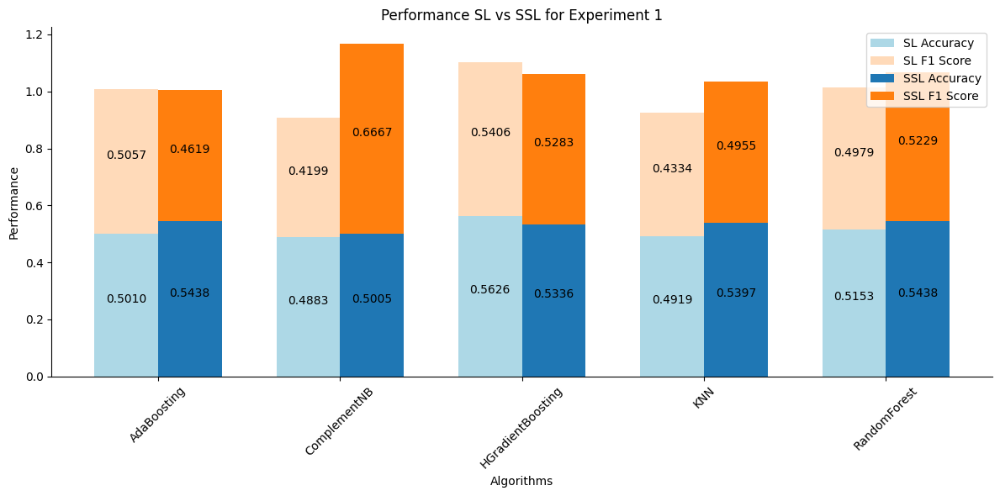

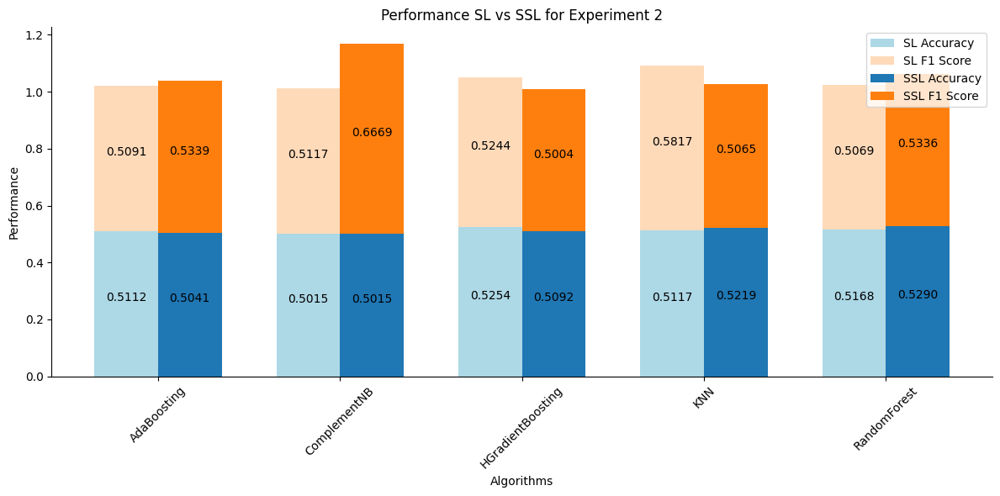

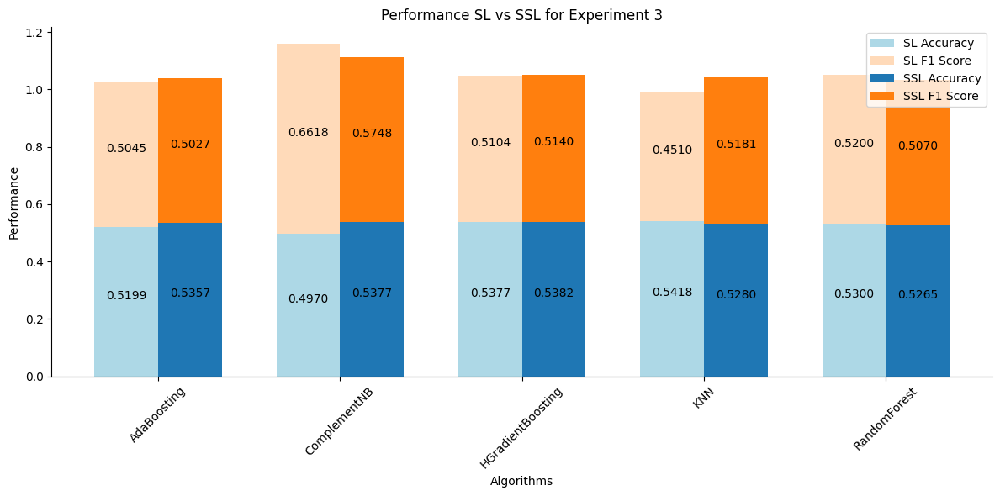

In [17]:

# Core experiment directories and files
core_experiments = (
    './Data_evaluation/results/P_all_f/25%_Xl_Balanced/Df_metrics.pickle',
    './Data_evaluation/results/P_RWselected_f/25%_Xl_Balanced/Df_metrics.pickle',
    './Data_evaluation/results/P_fs(all)/25%_Xl_Balanced/Df_metrics.pickle'
)

# Models
models = (
    ('AdaBoosting', 'SelfTraining_AdaBoostClassifier'),
    ('ComplementNB', 'SelfTraining_ComplementNB'),
    ('HGradientBoosting', 'SelfTraining_HistGradientBoostingClassifier'),
    ('KNN', 'SelfTraining_KNeighborsClassifier'),
    ('RandomForest', 'SelfTraining_RandomForestClassifier')
)

# Load DataFrames
dfs = []
for file in core_experiments:
    with open(file, 'rb') as f:
        dfs.append(pickle.load(f))

# Plotting
for i, df in enumerate(dfs):
    fig, ax = plt.subplots(figsize=(12, 6))
    
    indices = np.arange(len(models))
    width = 0.35  # width of the bars
    
    # Prepare data
    sl_accs = []
    sl_f1_scores = []
    ssl_accs = []
    ssl_f1_scores = []
    
    for model in models:
        sl_row = df[df['algorithm'] == model[0]]
        if model[0] == 'ComplementNB' and i == 1:
            sl_acc = 0.50154
            sl_f1 = 0.511656
        else: 
            sl_acc = sl_row['acc'].values[0]
            sl_f1 = sl_row['f1'].values[0]
        
        ssl_row = df[df['algorithm'] == model[1]]
        ssl_acc = ssl_row['acc'].values[0]
        ssl_f1 = ssl_row['f1'].values[0]
        
        sl_accs.append(sl_acc)
        sl_f1_scores.append(sl_f1)
        ssl_accs.append(ssl_acc)
        ssl_f1_scores.append(ssl_f1)
        
    # Plot SL bars
    ax.bar(indices - width/2, sl_accs, width, label='SL Accuracy', color='lightblue')
    ax.bar(indices - width/2, sl_f1_scores, width, bottom=sl_accs, label='SL F1 Score', color='peachpuff')
    
    # Plot SSL bars
    ax.bar(indices + width/2, ssl_accs, width, label='SSL Accuracy')
    ax.bar(indices + width/2, ssl_f1_scores, width, bottom=ssl_accs, label='SSL F1 Score')

    # Add performance values on top of each bar
    for idx in range(len(models)):
        sl_acc = sl_accs[idx]
        sl_f1 = sl_f1_scores[idx]
        sl_total = sl_acc + sl_f1
        ax.text(idx - width/2, sl_acc / 2, f'{sl_acc:.4f}', ha='center', va='bottom')
        if sl_f1 < 0.1:
            ax.text(idx - width/2, sl_total + 0.01 , f'{sl_f1:.4f}', ha='center', va='bottom')
        else:
            ax.text(idx - width/2, sl_acc + sl_f1 / 2, f'{sl_f1:.4f}', ha='center', va='bottom')
        
        ssl_acc = ssl_accs[idx]
        ssl_f1 = ssl_f1_scores[idx]
        ssl_total = ssl_acc + ssl_f1
        ax.text(idx + width/2, ssl_acc / 2, f'{ssl_acc:.4f}', ha='center', va='bottom')
        if ssl_f1 < 0.1:
            ax.text(idx + width/2, ssl_total + 0.01, f'{ssl_f1:.4f}', ha='center', va='bottom')
        else:
            ax.text(idx + width/2, ssl_acc + ssl_f1 / 2, f'{ssl_f1:.4f}', ha='center', va='bottom')

    # Add labels and title
    ax.set_xlabel('Algorithms')
    ax.set_ylabel('Performance')
    ax.set_title(f'Performance SL vs SSL for Experiment {i+1}')
    ax.set_xticks(indices)
    ax.set_xticklabels([m[0] for m in models])
    
    # Place legend outside the plot area
    ax.legend()
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


Como a % de XU altera o comportamento de SSL

,algorithm,acc,ball_acc,f1,prec,recall
5,SelfTraining_HistGradientBoostingClassifier,0.55078,0.55078,0.535957,0.55454,0.51858
6,SelfTraining_KNeighborsClassifier,0.54596,0.54596,0.482963,0.55530,0.42730
7,SelfTraining_RandomForestClassifier,0.50268,0.50296,0.509644,0.50088,0.51872
8,SelfTraining_AdaBoostClassifier,0.54828,0.54864,0.511354,0.55620,0.47320


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


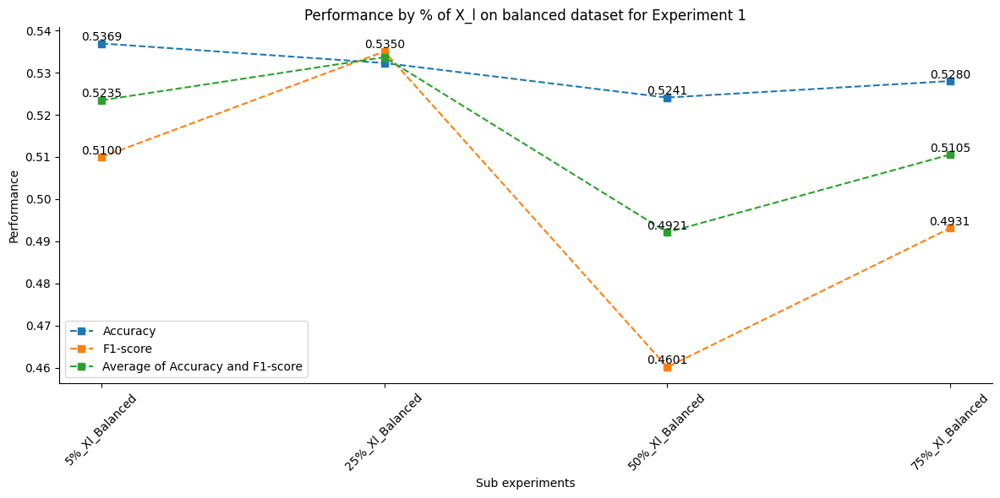

,algorithm,acc,ball_acc,f1,prec,recall
5,SelfTraining_HistGradientBoostingClassifier,0.50000,0.50096,0.516303,0.50422,0.52898
6,SelfTraining_KNeighborsClassifier,0.51240,0.51244,0.507865,0.51902,0.49718
7,SelfTraining_RandomForestClassifier,0.55058,0.55072,0.537288,0.55858,0.51756
8,SelfTraining_AdaBoostClassifier,0.49230,0.49262,0.489736,0.49698,0.48270


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


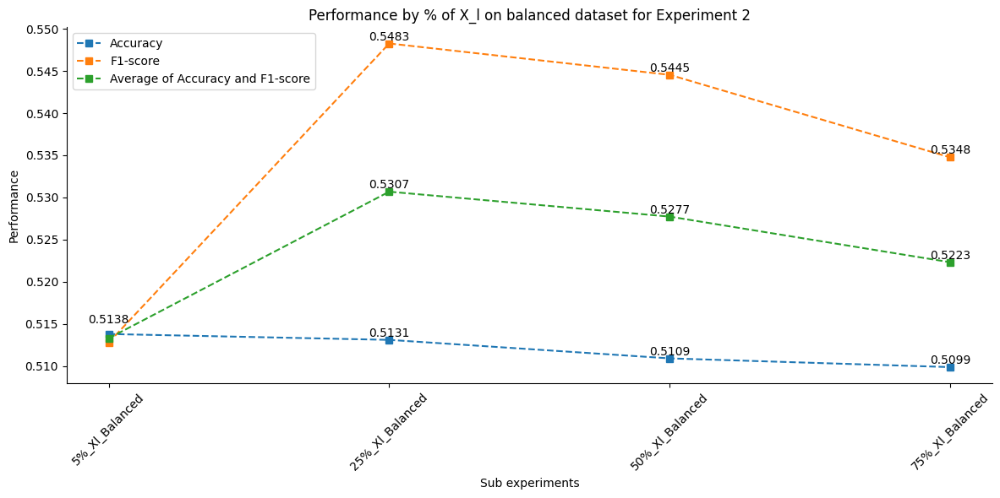

,algorithm,acc,ball_acc,f1,prec,recall
5,SelfTraining_ComplementNB,0.49228,0.49210,0.524661,0.47966,0.57898
6,SelfTraining_HistGradientBoostingClassifier,0.53816,0.53884,0.534731,0.53018,0.53936
7,SelfTraining_KNeighborsClassifier,0.54054,0.54156,0.526323,0.52820,0.52446
8,SelfTraining_RandomForestClassifier,0.50500,0.50570,0.490625,0.50398,0.47796
9,SelfTraining_AdaBoostClassifier,0.53270,0.53412,0.505488,0.54034,0.47486


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


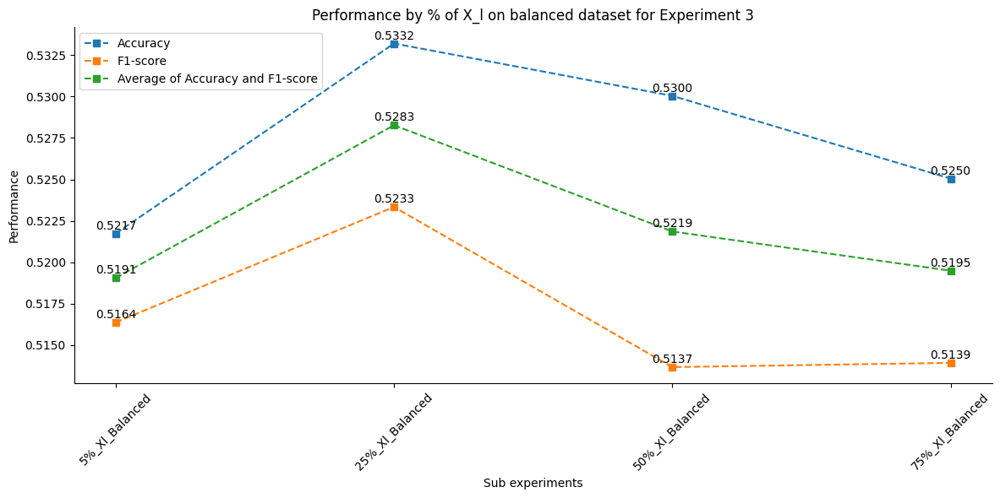

In [20]:
main_names = ('P_all_f', 'P_RWselected_f', 'P_fs(all)')

# Core experiment directories and files
core_experiments = (
    './Data_evaluation/results/P_all_f/',
    './Data_evaluation/results/P_RWselected_f/',
    './Data_evaluation/results/P_fs(all)/'
)

# Plotting
for exp, core_experiment in enumerate(core_experiments):

    sub_experiments = (
        '5%_Xl_Balanced',
        '25%_Xl_Balanced',
        '50%_Xl_Balanced',
        '75%_Xl_Balanced',
        '100%_Xl_Balanced'
    )
    indices = np.arange(len(sub_experiments))

    dfs = [pickle.load(open(f'{core_experiment}{sub_e}/Df_metrics.pickle', 'rb')) for sub_e in sub_experiments]
    filtered_dfs = [df[df['algorithm'].str.startswith('SelfTraining_')] for df in dfs]

    display(filtered_dfs[0])

    avg_accs = [df['acc'].mean() for df in filtered_dfs]
    avg_f1_scores = [df['f1'].mean() for df in filtered_dfs]
    avg_performances = [(df['acc'].mean() + df['f1'].mean()) / 2 for df in filtered_dfs]

    fig, ax = plt.subplots(figsize=(12, 6))

    ax.plot(sub_experiments, avg_accs, linestyle='dashed', marker='s', label='Accuracy')
    ax.plot(sub_experiments, avg_f1_scores, linestyle='dashed', marker='s', label='F1-score')
    ax.plot(sub_experiments, avg_performances, linestyle='dashed', marker='s', label='Average of Accuracy and F1-score')

    # Add performance values on top of each bar
    for idx in range(len(sub_experiments)):
        avg_acc = avg_accs[idx]
        avg_f1_score = avg_f1_scores[idx]
        avg_performance = avg_performances[idx]

        if round(avg_f1_score, 4) == 0.5350:
            ax.text(idx, avg_f1_score + 0.0001, f'{avg_f1_score:.4f}', ha='center', va='bottom')
        elif round(avg_acc, 4) == 0.5138:
            ax.text(idx, avg_acc + 0.001, f'{avg_acc:.4f}', ha='center', va='bottom')
        else:
            ax.text(idx, avg_acc + 0.0001, f'{avg_acc:.4f}', ha='center', va='bottom')
            ax.text(idx, avg_f1_score + 0.0001, f'{avg_f1_score:.4f}', ha='center', va='bottom')
            ax.text(idx, avg_performance + 0.0001, f'{avg_performance:.4f}', ha='center', va='bottom')

    ax.set_xlabel('Sub experiments')
    ax.set_ylabel('Performance')
    ax.set_title(f'Performance by % of X_l on balanced dataset for Experiment {exp+1}')

    if exp in (1, 2):
        ax.legend(loc='upper left')
    else:
        ax.legend(loc='lower left')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()